#### **0. Setup del notebook**

In [152]:
import os
import re
import numpy as np
import pandas as pd
import seaborn as sns
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from IPython.display import display
from matplotlib.colors import LogNorm
from matplotlib.patches import Rectangle

plt.rcParams["figure.figsize"] = (8, 6)
plt.rcParams["axes.grid"] = True

BASE_DIR = ".." 
ANN_PATH = os.path.join(BASE_DIR, "data", "annotations", "annotations.csv")

df = pd.read_csv(ANN_PATH)

for col in ["image_width", "image_height", "xmin", "ymin", "xmax", "ymax"]:
    df[col] = df[col].astype(float)

# Features geométricas de cada bounding box
df["box_width"]  = df["xmax"] - df["xmin"]
df["box_height"] = df["ymax"] - df["ymin"]
df["box_area"]   = df["box_width"] * df["box_height"]

df["img_area"]   = df["image_width"] * df["image_height"]

df["box_width_rel"]  = df["box_width"]  / df["image_width"]
df["box_height_rel"] = df["box_height"] / df["image_height"]
df["box_area_rel"]   = df["box_area"]   / df["img_area"]

df["cx_rel"] = (df["xmin"] + df["xmax"]) / 2 / df["image_width"]
df["cy_rel"] = (df["ymin"] + df["ymax"]) / 2 / df["image_height"]

df["box_aspect_ratio"] = df["box_width"] / df["box_height"]

df.head(3)


,image_id,image_width,image_height,class_name,xmin,ymin,xmax,ymax,tipo_obstaculo,temporalidad,...,box_width,box_height,box_area,img_area,box_width_rel,box_height_rel,box_area_rel,cx_rel,cy_rel,box_aspect_ratio
0,gsv-amsterdam-1071-Obstacle.png,1440.0,960.0,no_obstaculo,266.877470,0.0,433.833992,107.509881,NaN,NaN,...,166.956522,107.509881,17949.475855,1382400.0,0.115942,0.111989,0.012984,0.243303,0.055995,1.552941
1,gsv-amsterdam-1071-Obstacle.png,1440.0,960.0,no_obstaculo,135.335968,0.0,190.988142,118.893281,NaN,NaN,...,55.652174,118.893281,6616.669531,1382400.0,0.038647,0.123847,0.004786,0.113307,0.061924,0.468085
2,gsv-amsterdam-1071-Obstacle.png,1440.0,960.0,no_obstaculo,761.422925,0.0,809.486166,327.588933,NaN,NaN,...,48.063241,327.588933,15744.985861,1382400.0,0.033377,0.341238,0.011390,0.545455,0.170619,0.146718


#### **1. Análisis a nivel de imagen**

##### 1.0 Construcción de img_df (1 fila por imagen)

In [ ]:
# Estadísticas a nivel de imagen
img_df = df.groupby("image_id").agg(
    image_width=("image_width", "first"),
    image_height=("image_height", "first"),
    n_objects=("class_name", "count"),
    n_classes=("class_name", "nunique"),
)

img_df["img_area"] = img_df["image_width"] * img_df["image_height"]
img_df["objects_per_mpx"] = img_df["n_objects"] / (img_df["img_area"] / 1e6)
img_df["aspect_ratio"] = img_df["image_width"] / img_df["image_height"]

img_df.head()

,image_width,image_height,n_objects,n_classes,img_area,objects_per_mpx,aspect_ratio
image_id,,,,,,,
gsv-amsterdam-1071-Obstacle.png,1440.0,960.0,5,3,1382400.0,3.616898,1.5
gsv-amsterdam-1081-Obstacle.png,1440.0,960.0,4,3,1382400.0,2.893519,1.5
gsv-amsterdam-1105-Obstacle.png,1440.0,960.0,4,3,1382400.0,2.893519,1.5
gsv-amsterdam-1109-Obstacle.png,1440.0,960.0,9,4,1382400.0,6.510417,1.5
gsv-amsterdam-1114-Obstacle.png,1440.0,960.0,10,4,1382400.0,7.233796,1.5


##### 1.1 Resolución y formato de las imágenes

In [154]:
# Estadísticos de resolución y aspect ratio
tabla_resolucion = img_df[["image_width", "image_height", "aspect_ratio"]].describe().round(2)

print("Estadísticos de resolución y aspect ratio:\n")
display(tabla_resolucion)

tabla_resolucion_latex = tabla_resolucion.to_latex("C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/tabla_resolucion.tex")
print("Tabla guardada tabla_resolucion.tex'\n")

Estadísticos de resolución y aspect ratio:



,image_width,image_height,aspect_ratio
count,1250.0,1250.0,1250.0
mean,1440.0,960.0,1.5
std,0.0,0.0,0.0
min,1440.0,960.0,1.5
25%,1440.0,960.0,1.5
50%,1440.0,960.0,1.5
75%,1440.0,960.0,1.5
max,1440.0,960.0,1.5


Tabla guardada tabla_resolucion.tex'



#### 1.2 Complejidad de la escena

##### 1.2.1 Número de objetos por imagen

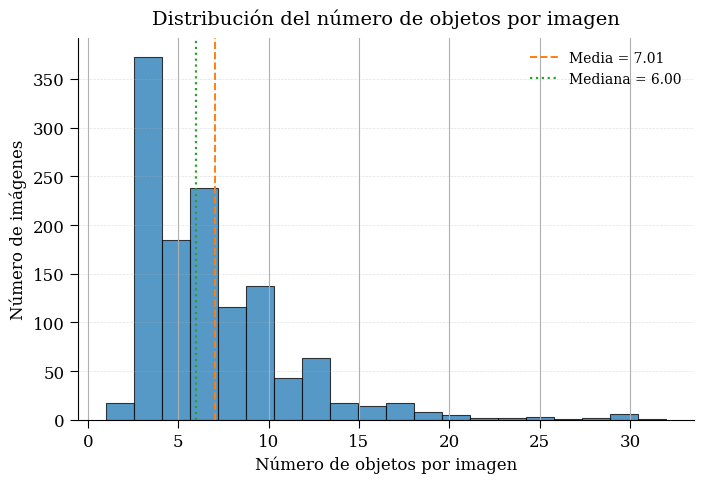

Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/fig_dist_num_objetos_color.pdf


In [ ]:
# Estilo general
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 12
plt.rcParams["axes.linewidth"] = 0.8

data = img_df["n_objects"]

fig, ax = plt.subplots(figsize=(7.2, 5))

# Histograma
n, bins, patches = ax.hist(
    data,
    bins=20,
    edgecolor="black",
    linewidth=0.8,
    color=plt.get_cmap("tab10")(0), 
    alpha=0.75
)

# Media y mediana
mean_val = data.mean()
median_val = data.median()

ax.axvline(
    mean_val,
    color=plt.get_cmap("tab10")(1), 
    linestyle="--",
    linewidth=1.4,
    label=f"Media = {mean_val:.2f}"
)

ax.axvline(
    median_val,
    color=plt.get_cmap("tab10")(2),
    linestyle=":",
    linewidth=1.6,
    label=f"Mediana = {median_val:.2f}"
)

# Títulos y ejes
ax.set_title("Distribución del número de objetos por imagen", fontsize=14, pad=10)
ax.set_xlabel("Número de objetos por imagen", fontsize=12)
ax.set_ylabel("Número de imágenes", fontsize=12)

ax.grid(
    True,
    linestyle="--",
    linewidth=0.5,
    alpha=0.35,
    axis="y"
)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

ax.spines["left"].set_linewidth(0.8)
ax.spines["bottom"].set_linewidth(0.8)

ax.tick_params(direction="out", length=6, width=0.8)

ax.legend(frameon=False, loc="upper right")

plt.tight_layout()
plt.show()

# Guardar figura
out_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/fig_dist_num_objetos_color.pdf"
fig.savefig(out_path, dpi=300, bbox_inches="tight")
print(f"Figura guardada en: {out_path}")

#### 1.2.2 Niveles de complejidad (baja / media / alta)

In [ ]:
# Cálculo de solapamiento entre bounding boxes en cada imagen
def iou(box_a, box_b):
    """
    box_a, box_b: (xmin, ymin, xmax, ymax)
    devuelve IoU en [0,1]
    """
    xa1, ya1, xa2, ya2 = box_a
    xb1, yb1, xb2, yb2 = box_b

    inter_x1 = max(xa1, xb1)
    inter_y1 = max(ya1, yb1)
    inter_x2 = min(xa2, xb2)
    inter_y2 = min(ya2, yb2)

    inter_w = max(0, inter_x2 - inter_x1)
    inter_h = max(0, inter_y2 - inter_y1)
    inter_area = inter_w * inter_h

    area_a = max(0, (xa2 - xa1)) * max(0, (ya2 - ya1))
    area_b = max(0, (xb2 - xb1)) * max(0, (yb2 - yb1))

    union = area_a + area_b - inter_area
    if union <= 0:
        return 0.0
    return inter_area / union

# Calculamos ratio de solapamiento por imagen
overlap_list = []
iou_threshold = 0.1

for img_id, group in df.groupby("image_id"):
    boxes = group[["xmin", "ymin", "xmax", "ymax"]].values
    n = len(boxes)

    if n < 2:
        overlap_ratio = 0.0
    else:
        total_pairs = n * (n - 1) / 2
        overlapping_pairs = 0

        for i in range(n):
            for j in range(i + 1, n):
                if iou(boxes[i], boxes[j]) > iou_threshold:
                    overlapping_pairs += 1

        overlap_ratio = overlapping_pairs / total_pairs

    overlap_list.append((img_id, overlap_ratio))

overlap_df = pd.DataFrame(overlap_list, columns=["image_id", "overlap_ratio"]).set_index("image_id")

img_df = img_df.join(overlap_df, how="left")
img_df["overlap_ratio"] = img_df["overlap_ratio"].fillna(0.0)

Umbral baja/media: 0.2204650188521156
Umbral media/alta: 0.273435972629521
                  recuento  porcentaje
complexity_level                      
alta                   406       32.48
baja                   421       33.68
media                  423       33.84


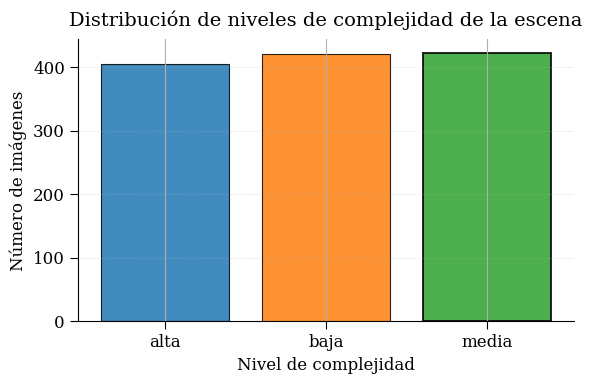

Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/distribucion_niveles_complejidad_color.pdf


In [ ]:

# Contar obstáculos y no_obstáculos
obst_counts = (
    df[df["class_name"] == "obstaculo"]
    .groupby("image_id")["class_name"]
    .count()
    .rename("n_obstaculo")
)

no_obst_counts = (
    df[df["class_name"] == "no_obstaculo"]
    .groupby("image_id")["class_name"]
    .count()
    .rename("n_no_obstaculo")
)

img_df = img_df.join(obst_counts, how="left")
img_df = img_df.join(no_obst_counts, how="left")

img_df["n_obstaculo"] = img_df["n_obstaculo"].fillna(0).astype(int)
img_df["n_no_obstaculo"] = img_df["n_no_obstaculo"].fillna(0).astype(int)

# Cálculo del índice de complejidad
features = ["n_objects", "n_classes", "n_obstaculo", "n_no_obstaculo"]

for f in features:
    f_min = img_df[f].min()
    f_max = img_df[f].max()
    if f_max > f_min:
        img_df[f + "_norm"] = (img_df[f] - f_min) / (f_max - f_min)
    else:
        img_df[f + "_norm"] = 0.0

img_df["complexity_index"] = (
    img_df["n_objects_norm"]
    + img_df["n_classes_norm"]
    + img_df["n_obstaculo_norm"]
    + img_df["n_no_obstaculo_norm"]
    + img_df["overlap_ratio"]
) / 5.0

img_df["complexity_index"].describe()

img_df["complexity_index"] = (
    0.25 * img_df["n_objects_norm"]
    + 0.15 * img_df["n_classes_norm"]
    + 0.2 * img_df["n_obstaculo_norm"]
    + 0.15 * img_df["n_no_obstaculo_norm"]
    + 0.25 * img_df["overlap_ratio"]
)

q_low, q_high = img_df["complexity_index"].quantile([1/3, 2/3])

print("Umbral baja/media:", q_low)
print("Umbral media/alta:", q_high)

def assign_complexity_level(x, q1, q2):
    if x <= q1:
        return "baja"
    elif x <= q2:
        return "media"
    else:
        return "alta"

img_df["complexity_level"] = img_df["complexity_index"].apply(
    lambda x: assign_complexity_level(x, q_low, q_high)
)

complexity_counts = img_df["complexity_level"].value_counts().sort_index()
complexity_perc = (complexity_counts / len(img_df) * 100)

tabla_complexity = pd.DataFrame({
    "recuento": complexity_counts,
    "porcentaje": complexity_perc,
}).round(2)

print(tabla_complexity)

# Guardar tabla en LaTeX
tabla_complexity.to_latex("C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/tabla_complexity.tex")

# Gráfico de barras de distribución de niveles de complejidad
fig, ax = plt.subplots(figsize=(6, 4))

cmap = plt.get_cmap("tab10")
bar_colors = [cmap(0), cmap(1), cmap(2)] 

bars = ax.bar(
    tabla_complexity.index,
    tabla_complexity["recuento"],
    edgecolor="black",
    linewidth=0.8,
    color=bar_colors,
    alpha=0.85
)

imax = int(tabla_complexity["recuento"].values.argmax())
bars[imax].set_linewidth(1.4)

ax.set_title("Distribución de niveles de complejidad de la escena", fontsize=14, pad=10)
ax.set_xlabel("Nivel de complejidad", fontsize=12)
ax.set_ylabel("Número de imágenes", fontsize=12)

ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.35, axis="y")
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_linewidth(0.8)
ax.spines["bottom"].set_linewidth(0.8)
ax.tick_params(direction="out", length=6, width=0.8)

plt.tight_layout()
plt.show()

# Guardar figura
out_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/distribucion_niveles_complejidad_color.pdf"
fig.savefig(out_path, dpi=300, bbox_inches="tight")
print(f"Figura guardada en: {out_path}")

In [158]:
# Correlaciones de overlap_ratio con n_objects y complexity_index
corr_overlap_objects = img_df[["overlap_ratio", "n_objects"]].corr().iloc[0, 1]
corr_overlap_index   = img_df[["overlap_ratio", "complexity_index"]].corr().iloc[0, 1]
print(f"Correlación overlap_ratio vs n_objects: {corr_overlap_objects:.3f}")
print(f"Correlación overlap_ratio vs complexity_index: {corr_overlap_index:.3f}")

Correlación overlap_ratio vs n_objects: -0.465
Correlación overlap_ratio vs complexity_index: 0.117


Umbral Baja/Media: 0.2204650188521156
Umbral Media/Alta: 0.273435972629521


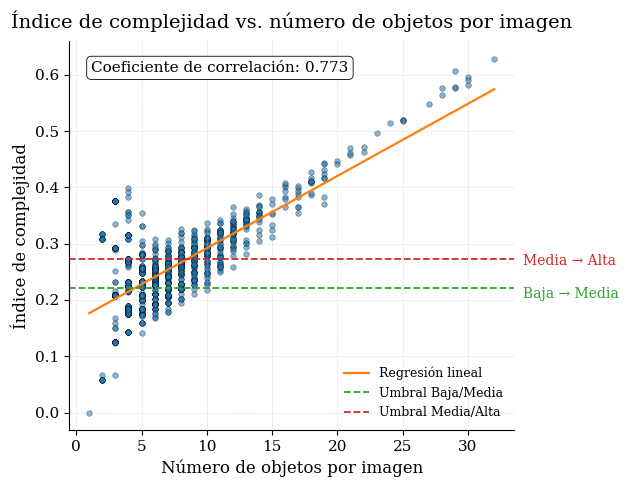

Correlación entre n_objects y complexity_index: 0.773
Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/indice_complejidad_vs_numero_objetos_color.pdf


In [ ]:
# Umbrales de complejidad
q_low, q_high = img_df["complexity_index"].quantile([1/3, 2/3])
print("Umbral Baja/Media:", q_low)
print("Umbral Media/Alta:", q_high)

x = img_df["n_objects"].values
y = img_df["complexity_index"].values

# Estilo
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 11
plt.rcParams["axes.linewidth"] = 0.8

fig, ax = plt.subplots(figsize=(7, 5))

cmap = plt.get_cmap("tab10")
c_scatter = cmap(0)  
c_reg     = cmap(1) 
c_thr1    = cmap(2)
c_thr2    = cmap(3) 

# Scatter
ax.scatter(
    x, y,
    s=16,
    alpha=0.55,
    color=c_scatter,
    edgecolors="black",
    linewidths=0.35
)

# Línea de regresión
if len(x) > 1:
    coeffs = np.polyfit(x, y, 1)
    x_line = np.linspace(x.min(), x.max(), 100)
    y_line = np.polyval(coeffs, x_line)
    ax.plot(x_line, y_line, color=c_reg, linewidth=1.6, label="Regresión lineal")

# Líneas de umbral
ax.axhline(q_low,  color=c_thr1, linestyle="--", linewidth=1.3, label="Umbral Baja/Media")
ax.axhline(q_high, color=c_thr2, linestyle="--", linewidth=1.3, label="Umbral Media/Alta")

# Texto de umbrales
ax.text(
    1.02,
    (q_low - y.min()) / (y.max() - y.min()),
    "Baja → Media",
    transform=ax.transAxes,
    va="center",
    fontsize=10,
    color=c_thr1
)

ax.text(
    1.02,
    (q_high - y.min()) / (y.max() - y.min()),
    "Media → Alta",
    transform=ax.transAxes,
    va="center",
    fontsize=10,
    color=c_thr2
)

# Correlación
corr = np.corrcoef(x, y)[0, 1]
ax.text(
    0.05,
    0.95,
    f"Coeficiente de correlación: {corr:.3f}",
    transform=ax.transAxes,
    ha="left",
    va="top",
    fontsize=11,
    bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", linewidth=0.6)
)

# Títulos y ejes
ax.set_title("Índice de complejidad vs. número de objetos por imagen", fontsize=14, pad=10)
ax.set_xlabel("Número de objetos por imagen", fontsize=12)
ax.set_ylabel("Índice de complejidad", fontsize=12)

ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.4)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

ax.legend(frameon=False, loc="lower right", fontsize=9)

plt.tight_layout(rect=[0, 0, 0.92, 1])
plt.show()

# Guardar figura
output_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/indice_complejidad_vs_numero_objetos_color.pdf"
fig.savefig(output_path, dpi=300, bbox_inches="tight")

print(f"Correlación entre n_objects y complexity_index: {corr:.3f}")
print(f"Figura guardada en: {output_path}")

#### 1.3 Combinaciones de clases por imagen

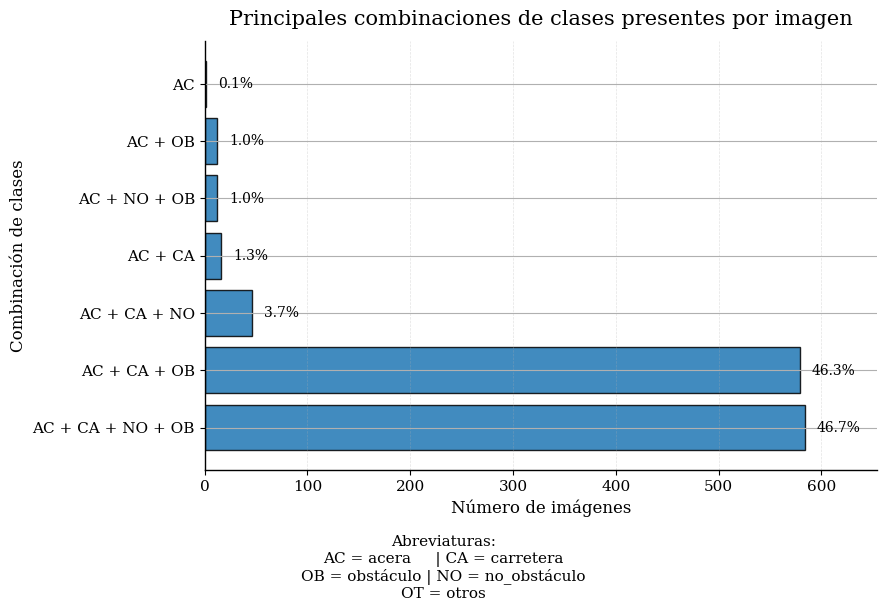

Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/combinaciones_clases_por_imagen_color.pdf


In [ ]:
# Clases únicas por imagen
clases_por_imagen = (
    df.groupby("image_id")["class_name"]
    .apply(lambda x: tuple(sorted(set(x))))
    .reset_index(name="clases")
)

# Recuento de combinaciones
tabla_combos = (
    clases_por_imagen
    .value_counts("clases")
    .reset_index(name="recuento")
)

# Porcentaje
total_imgs = tabla_combos["recuento"].sum()
tabla_combos["porcentaje"] = 100 * tabla_combos["recuento"] / total_imgs

tabla_combos = tabla_combos.sort_values("recuento", ascending=False)

abbr_map = {
    "acera": "AC",
    "carretera": "CA",
    "obstaculo": "OB",
    "no_obstaculo": "NO",
    "otros": "OT"
}

def combo_to_label(combo):
    """
    Convierte ('acera','carretera','obstaculo') → AC + CA + OB
    """
    if not combo:
        return ""
    
    abbrs = [abbr_map.get(c, c[:3].upper()) for c in combo]
    return " + ".join(abbrs)

# Preparar tabla para graficar
tabla_plot = tabla_combos.copy()
tabla_plot["label"] = tabla_plot["clases"].apply(combo_to_label)

n_combos = len(tabla_plot)
fig_height = 0.6 * n_combos + 1.2 

# Estilo
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 11


fig, ax = plt.subplots(figsize=(9, fig_height))

blue = plt.get_cmap("tab10")(0)

bars = ax.barh(
    tabla_plot["label"],
    tabla_plot["recuento"],
    color=blue,
    edgecolor="black",
    linewidth=1.0,
    alpha=0.85
)

# Etiquetas de porcentaje
xmax = float(tabla_plot["recuento"].max()) if len(tabla_plot) else 0.0
xpad = max(1.0, xmax * 0.02)

for bar, pct in zip(bars, tabla_plot["porcentaje"]):
    ax.text(
        bar.get_width() + xpad,
        bar.get_y() + bar.get_height() / 2,
        f"{pct:.1f}%",
        va="center",
        fontsize=10,
        color="black"
    )

# Títulos y ejes
ax.set_title(
    "Principales combinaciones de clases presentes por imagen",
    fontsize=15,
    pad=12
)
ax.set_xlabel("Número de imágenes", fontsize=12)
ax.set_ylabel("Combinación de clases", fontsize=12)

ax.grid(True, axis="x", linestyle="--", linewidth=0.5, alpha=0.35)

for spine in ["top", "right"]:
    ax.spines[spine].set_visible(False)

ax.spines["left"].set_linewidth(1.0)
ax.spines["bottom"].set_linewidth(1.0)

ax.set_xlim(0, xmax + 6 * xpad)

# Leyenda
legend_text = (
    "Abreviaturas:\n"
    "AC = acera     | CA = carretera\n"
    "OB = obstáculo | NO = no_obstáculo\n"
    "OT = otros"
)

fig.text(
    0.5, -0.12,
    legend_text,
    ha="center",
    fontsize=11
)

fig.subplots_adjust(bottom=0.25)
plt.tight_layout()
plt.show()

# Guardar figura
output_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/combinaciones_clases_por_imagen_color.pdf"
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Figura guardada en: {output_path}")

In [ ]:
# Estilo
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 11
plt.rcParams["axes.linewidth"] = 0.8

def extract_city(image_id: str) -> str:
    """
    Espera formatos tipo:
    gsv-amsterdam-1071-Obstacle.png
    gsv-ciudad_de_mexico-0123-Obstacle.png
    gsv-mexico_city-0123-Obstacle.png

    Extrae lo que va tras 'gsv-' y antes del siguiente '-<digits>-'.
    """
    s = str(image_id)
    m = re.search(r"^gsv-([^-]+(?:-[^-]+)*)-\d+-", s)
    if m:
        city = m.group(1)
    else:
        parts = s.split("-")
        city = parts[1] if len(parts) > 1 else "unknown"
    return city.lower()

df_city = df.copy()
df_city["city"] = df_city["image_id"].apply(extract_city)

df_city[["image_id","city"]].head()

,image_id,city
0,gsv-amsterdam-1071-Obstacle.png,amsterdam
1,gsv-amsterdam-1071-Obstacle.png,amsterdam
2,gsv-amsterdam-1071-Obstacle.png,amsterdam
3,gsv-amsterdam-1071-Obstacle.png,amsterdam
4,gsv-amsterdam-1071-Obstacle.png,amsterdam


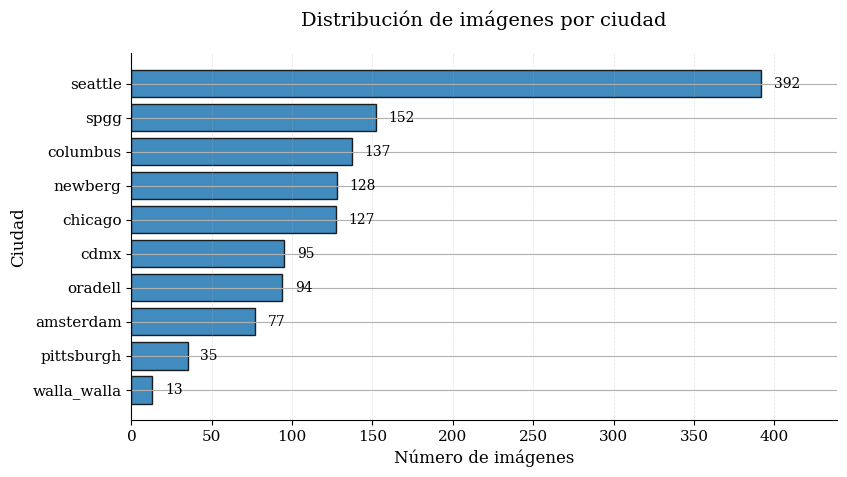

Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/distribucion_imagenes_por_ciudad_color.pdf


In [ ]:
img_per_city = (
    df_city[["image_id", "city"]]
    .drop_duplicates()
    .groupby("city")
    .size()
    .sort_values(ascending=True)
)

TOP_N = 25
if len(img_per_city) > TOP_N:
    top = img_per_city.iloc[-TOP_N:]
    rest = img_per_city.iloc[:-TOP_N].sum()
    img_per_city = pd.concat([pd.Series({"otros": rest}), top]).sort_values(ascending=True)

fig_h = max(3.4, 0.35 * len(img_per_city) + 1.4)
fig, ax = plt.subplots(figsize=(8.6, fig_h))

blue = plt.get_cmap("tab10")(0)

bars = ax.barh(
    img_per_city.index,
    img_per_city.values,
    color=blue,
    edgecolor="black",
    linewidth=1.0,
    alpha=0.85
)

xmax = float(img_per_city.max()) if len(img_per_city) else 0.0
xpad = max(1.0, 0.02 * xmax)

for b, v in zip(bars, img_per_city.values):
    ax.text(
        float(v) + xpad,
        b.get_y() + b.get_height() / 2,
        f"{int(v)}",
        va="center",
        fontsize=10,
        color="black"
    )

ax.set_title("Distribución de imágenes por ciudad", fontsize=14, pad=20)
ax.set_xlabel("Número de imágenes", fontsize=12)
ax.set_ylabel("Ciudad", fontsize=12)

ax.grid(True, axis="x", linestyle="--", linewidth=0.5, alpha=0.35)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

ax.set_xlim(0, xmax + 6 * xpad)

plt.tight_layout()
plt.show()

# Guardar figura
output_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/distribucion_imagenes_por_ciudad_color.pdf"
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Figura guardada en: {output_path}")

#### **2. Análisis por bounding box y clases**

##### 2.1 Distribución de clases

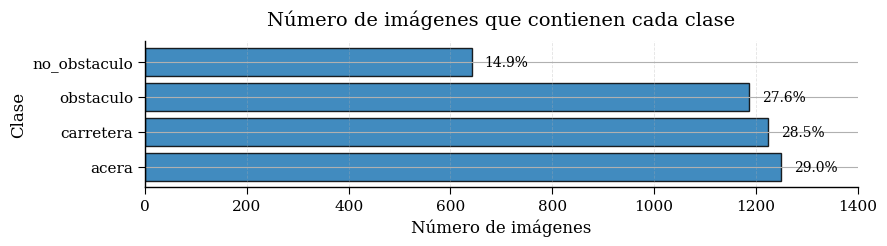

Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/distribucion_imagenes_por_clase_color.pdf


In [ ]:
# Número de imágenes en las que aparece cada clase
class_img_counts = (
    df.groupby("class_name")["image_id"]
      .nunique()
      .sort_values(ascending=False)
)

class_img_perc = (class_img_counts / class_img_counts.sum() * 100).round(2)

tabla_img_clases = pd.DataFrame({
    "Clase": class_img_counts.index,
    "Imagenes": class_img_counts.values,
    "Porcentaje": class_img_perc.values
})

# Estilo
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 11
plt.rcParams["axes.linewidth"] = 0.8

# Gráfico
fig_height = 0.4 * len(class_img_counts) + 1
fig, ax = plt.subplots(figsize=(9, fig_height))

blue = plt.get_cmap("tab10")(0)

bars = ax.barh(
    tabla_img_clases["Clase"],
    tabla_img_clases["Imagenes"],
    color=blue,
    edgecolor="black",
    linewidth=1.0,
    alpha=0.85
)

xmax = float(class_img_counts.max()) if len(class_img_counts) else 0.0
xpad = max(1.0, 0.02 * xmax)

for bar, pct in zip(bars, tabla_img_clases["Porcentaje"]):
    ax.text(
        bar.get_width() + xpad,
        bar.get_y() + bar.get_height()/2,
        f"{pct:.1f}%",
        va="center",
        fontsize=10,
        color="black"
    )

# Títulos y ejes
ax.set_title("Número de imágenes que contienen cada clase", fontsize=14, pad=12)
ax.set_xlabel("Número de imágenes", fontsize=12)
ax.set_ylabel("Clase", fontsize=12)

ax.grid(True, axis="x", linestyle="--", linewidth=0.6, alpha=0.35)

for spine in ["top", "right"]:
    ax.spines[spine].set_visible(False)
ax.spines["left"].set_linewidth(1.0)
ax.spines["bottom"].set_linewidth(1.0)

ax.tick_params(direction="out", length=5, width=0.8)

ax.set_xlim(0, xmax + 6 * xpad)

plt.tight_layout()
plt.show()

# Guardar figura
output_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/distribucion_imagenes_por_clase_color.pdf"
fig.savefig(output_path, dpi=300, bbox_inches="tight")

# Guardar tabla en LaTeX
tabla_img_clases.to_latex("C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/tabla_imagenes_por_clase.tex")
print(f"Figura guardada en: {output_path}")

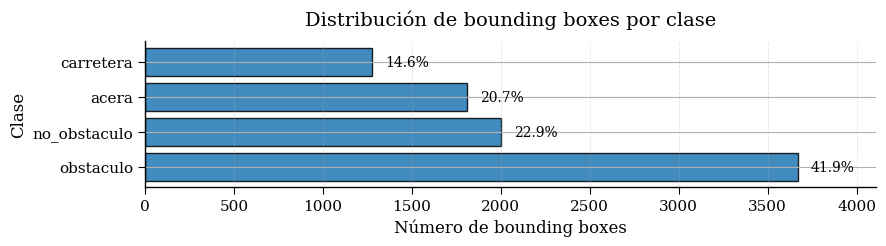

Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/distribucion_bounding_boxes_por_clase_color.pdf


In [ ]:
# Contar clases
class_counts = df["class_name"].value_counts()
class_perc = (class_counts / class_counts.sum() * 100).round(2)

# Tabla combinada
tabla_clases = pd.DataFrame({
    "Clase": class_counts.index,
    "Recuento": class_counts.values,
    "Porcentaje": class_perc.values
})

# Estilo
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 11
plt.rcParams["axes.linewidth"] = 0.8

# Gráfico
fig_height = 0.4 * len(class_counts) + 1
fig, ax = plt.subplots(figsize=(9, fig_height))

blue = plt.get_cmap("tab10")(0)

bars = ax.barh(
    tabla_clases["Clase"],
    tabla_clases["Recuento"],
    color=blue,
    edgecolor="black",
    linewidth=1.0,
    alpha=0.85
)

xmax = float(class_counts.max()) if len(class_counts) else 0.0
xpad = max(1.0, 0.02 * xmax)

for bar, pct in zip(bars, tabla_clases["Porcentaje"]):
    ax.text(
        bar.get_width() + xpad,
        bar.get_y() + bar.get_height()/2,
        f"{pct:.1f}%",
        va="center",
        fontsize=10,
        color="black"
    )

# Títulos y ejes
ax.set_title("Distribución de bounding boxes por clase", fontsize=14, pad=12)
ax.set_xlabel("Número de bounding boxes", fontsize=12)
ax.set_ylabel("Clase", fontsize=12)

ax.grid(True, axis="x", linestyle="--", linewidth=0.6, alpha=0.35)

for spine in ["top", "right"]:
    ax.spines[spine].set_visible(False)
ax.spines["left"].set_linewidth(1.0)
ax.spines["bottom"].set_linewidth(1.0)

ax.tick_params(direction="out", length=5, width=0.8)

ax.set_xlim(0, xmax + 6 * xpad)

plt.tight_layout()
plt.show()

# Guardar figura
output_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/distribucion_bounding_boxes_por_clase_color.pdf"
fig.savefig(output_path, dpi=300, bbox_inches="tight")

# Guardar tabla en LaTeX
tabla_clases.to_latex("C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/tabla_bounding_boxes_por_clase.tex")
print(f"Figura guardada en: {output_path}")

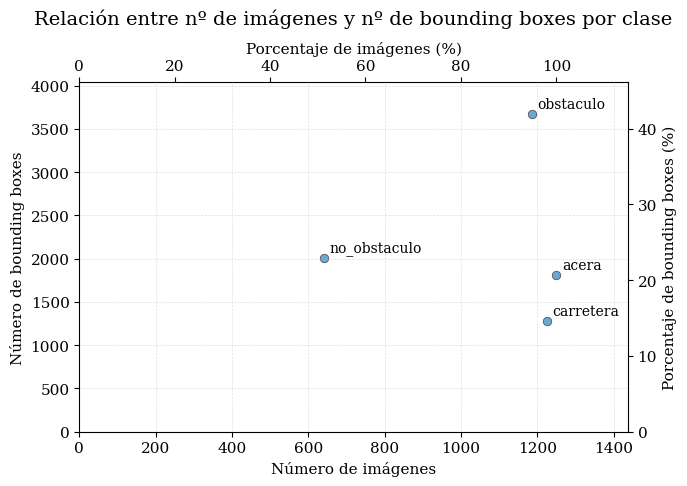

Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/relacion_n_imagenes_n_bounding_boxes_por_clase_color.pdf


In [ ]:
# Cálculo de métricas por clase

class_counts = df["class_name"].value_counts()
class_img_counts = (
    df.groupby("class_name")["image_id"]
      .nunique()
      .reindex(class_counts.index)
)

clase_stats = pd.DataFrame({
    "class_name": class_counts.index,
    "n_bboxes": class_counts.values,
    "n_images": class_img_counts.values
})

total_images = img_df.shape[0]
total_bboxes = df.shape[0]

# Estilo
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 11
plt.rcParams["axes.linewidth"] = 0.8

fig, ax = plt.subplots(figsize=(7, 5))

x = clase_stats["n_images"].values
y = clase_stats["n_bboxes"].values

cmap = plt.get_cmap("tab10")
c_scatter = cmap(0) 
c_key     = "black" 
c_edge    = "black"

# Scatter
ax.scatter(
    x, y,
    s=38,
    alpha=0.65,
    color=c_scatter,
    edgecolors=c_edge,
    linewidths=0.5
)

# Límites
xmax = float(x.max()) if len(x) else 0.0
ymax = float(y.max()) if len(y) else 0.0

ax.set_xlim(0, xmax * 1.15 if xmax > 0 else 1)
ax.set_ylim(0, ymax * 1.10 if ymax > 0 else 1)

# Ejes secundarios de porcentaje
ax_top = ax.secondary_xaxis(
    "top",
    functions=(
        lambda v: 100 * v / total_images,
        lambda p: p * total_images / 100
    )
)
ax_top.set_xlabel("Porcentaje de imágenes (%)")

ax_right = ax.secondary_yaxis(
    "right",
    functions=(
        lambda v: 100 * v / total_bboxes,
        lambda p: p * total_bboxes / 100
    )
)
ax_right.set_ylabel("Porcentaje de bounding boxes (%)")

claves = ["acera", "carretera", "obstaculo", "no_obstaculo"]
offset_x = ax.get_xlim()[1] * 0.01
offset_y = ax.get_ylim()[1] * 0.01

for cls in claves:
    if cls in clase_stats["class_name"].values:
        row = clase_stats[clase_stats["class_name"] == cls].iloc[0]
        ax.text(
            row["n_images"] + offset_x,
            row["n_bboxes"] + offset_y,
            cls,
            fontsize=10,
            ha="left",
            va="bottom",
            color=c_key,
            clip_on=False
        )

# Títulos y ejes
ax.set_title("Relación entre nº de imágenes y nº de bounding boxes por clase", fontsize=14, pad=12)
ax.set_xlabel("Número de imágenes")
ax.set_ylabel("Número de bounding boxes")

ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.4)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.tight_layout()
plt.show()

# Guardar figura
output_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/relacion_n_imagenes_n_bounding_boxes_por_clase_color.pdf"
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Figura guardada en: {output_path}")

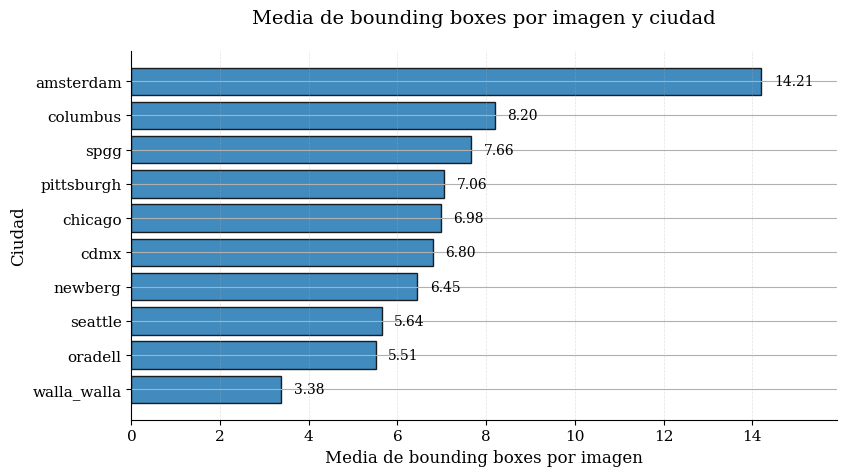

Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/media_bboxes_por_imagen_y_ciudad_color.pdf


In [ ]:
# Cajas por imagen y ciudad
boxes_per_image_city = (
    df_city.groupby(["city", "image_id"])
    .size()
    .rename("n_boxes")
    .reset_index()
)

# Resumen por ciudad
city_stats = (
    boxes_per_image_city.groupby("city")["n_boxes"]
    .agg(mean_boxes="mean", median_boxes="median", n_images="count")
    .sort_values("mean_boxes", ascending=True)
)

metric = "mean_boxes"
values = city_stats[metric]

TOP_N = 25
if len(values) > TOP_N:
    top = values.iloc[-TOP_N:]
    rest = city_stats.iloc[:-TOP_N]
    other_value = (rest["mean_boxes"] * rest["n_images"]).sum() / rest["n_images"].sum()
    values = pd.concat([pd.Series({"otros": other_value}), top]).sort_values(ascending=True)

plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 11
plt.rcParams["axes.linewidth"] = 0.8

fig_h = max(3.4, 0.35 * len(values) + 1.4)
fig, ax = plt.subplots(figsize=(8.6, fig_h))

blue = plt.get_cmap("tab10")(0)

bars = ax.barh(
    values.index,
    values.values,
    color=blue,
    edgecolor="black",
    linewidth=1.0,
    alpha=0.85
)

xmax = float(values.max()) if len(values) else 0.0
xpad = max(0.02 * xmax, 0.05)

for b, v in zip(bars, values.values):
    ax.text(
        float(v) + xpad,
        b.get_y() + b.get_height()/2,
        f"{v:.2f}",
        va="center",
        fontsize=10,
        color="black"
    )

title_metric = "media" if metric == "mean_boxes" else "mediana"
ax.set_title(f"{title_metric.capitalize()} de bounding boxes por imagen y ciudad", fontsize=14, pad=20)
ax.set_xlabel(f"{title_metric.capitalize()} de bounding boxes por imagen", fontsize=12)
ax.set_ylabel("Ciudad", fontsize=12)

ax.grid(True, axis="x", linestyle="--", linewidth=0.5, alpha=0.35)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

ax.set_xlim(0, xmax + 6 * xpad)

plt.tight_layout()
plt.show()

# Guardar figura
output_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/media_bboxes_por_imagen_y_ciudad_color.pdf"
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Figura guardada en: {output_path}")

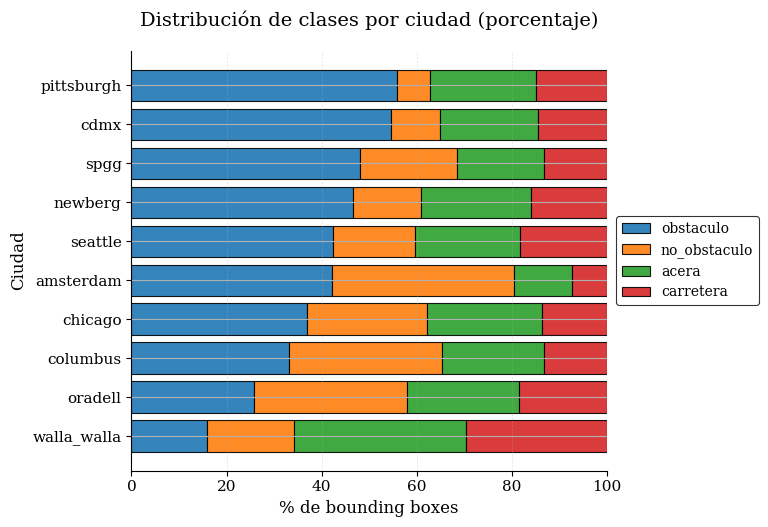

Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/distribucion_clases_por_ciudad_color.pdf


In [ ]:
main_classes = ["obstaculo", "no_obstaculo", "acera", "carretera"]
df_main = df_city[df_city["class_name"].isin(main_classes)].copy()

ct = pd.crosstab(df_main["city"], df_main["class_name"])

ct["total"] = ct.sum(axis=1)
ct = ct.sort_values("total", ascending=False).drop(columns=["total"])

TOP_N = 15
if len(ct) > TOP_N:
    ct = ct.iloc[:TOP_N]

ct_pct = ct.div(ct.sum(axis=1), axis=0) * 100
sort_col = "obstaculo" if "obstaculo" in ct_pct.columns else ct_pct.columns[0]
ct_pct = ct_pct.sort_values(sort_col, ascending=True)

# Estilo
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 11
plt.rcParams["axes.linewidth"] = 0.8

fig_h = max(3.6, 0.38 * len(ct_pct) + 1.6)
fig, ax = plt.subplots(figsize=(9.6, fig_h)) 

cmap = plt.get_cmap("tab10")
class_colors = {
    "obstaculo": cmap(0),    
    "no_obstaculo": cmap(1), 
    "acera": cmap(2), 
    "carretera": cmap(3), 
}

left = np.zeros(len(ct_pct))
for cls in [c for c in main_classes if c in ct_pct.columns]:
    vals = ct_pct[cls].values
    ax.barh(
        ct_pct.index, vals, left=left,
        color=class_colors.get(cls, cmap(0)),
        edgecolor="black", linewidth=0.8,
        label=cls,
        alpha=0.90
    )
    left += vals

ax.set_title("Distribución de clases por ciudad (porcentaje)", fontsize=14, pad=18)
ax.set_xlabel("% de bounding boxes", fontsize=12)
ax.set_ylabel("Ciudad", fontsize=12)
ax.set_xlim(0, 100)

ax.grid(True, axis="x", linestyle="--", linewidth=0.5, alpha=0.35)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

leg = ax.legend(
    frameon=True,
    fontsize=10,
    loc="center left",
    bbox_to_anchor=(1.02, 0.5),
    borderaxespad=0.0
)
leg.get_frame().set_edgecolor("black")
leg.get_frame().set_linewidth(0.8)

fig.tight_layout(rect=[0.0, 0.0, 0.82, 1.0])

plt.show()

# Guardar figura
output_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/distribucion_clases_por_ciudad_color.pdf"
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Figura guardada en: {output_path}")

##### 2.2 Tamaño de los bounding boxes

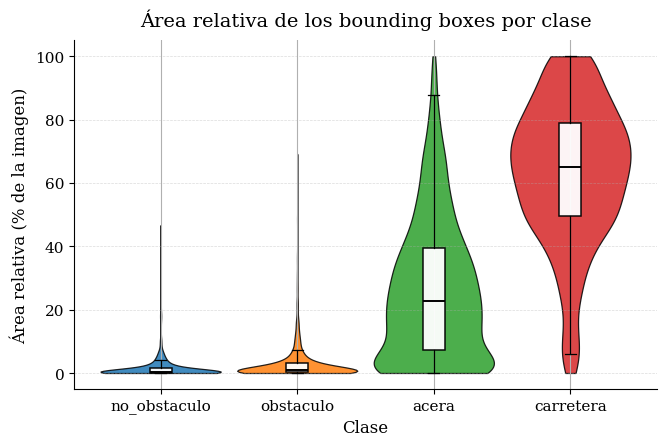

Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/area_relativa_bounding_boxes_por_clase_color.pdf


In [ ]:
clases_principales = ["obstaculo", "no_obstaculo", "acera", "carretera"]

df_main = df[df["class_name"].isin(clases_principales)].copy()
df_main["box_area_rel_pct"] = df_main["box_area_rel"] * 100 

# Ordenar clases por mediana de área
orden = (
    df_main.groupby("class_name")["box_area_rel_pct"]
    .median()
    .sort_values()
    .index
)

data = [df_main.loc[df_main["class_name"] == cls, "box_area_rel_pct"].dropna().values for cls in orden]

# Estilo
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 11
plt.rcParams["axes.linewidth"] = 0.8

fig, ax = plt.subplots(figsize=(6.8, 4.6))

cmap = plt.get_cmap("tab10")
colors = [cmap(i) for i in range(len(orden))]
positions = np.arange(1, len(orden) + 1)

# Violín
vp = ax.violinplot(
    data,
    positions=positions,
    widths=0.88,
    showmeans=False,
    showmedians=False,
    showextrema=False,
    points=200,
    bw_method="scott",
)
for i, body in enumerate(vp["bodies"]):
    body.set_facecolor(colors[i])
    body.set_edgecolor("black")
    body.set_linewidth(0.9)
    body.set_alpha(0.85)

bp = ax.boxplot(
    data,
    positions=positions,
    widths=0.16,
    patch_artist=True,
    showfliers=False,  
    manage_ticks=False,
    whis=1.5         
)

for box in bp["boxes"]:
    box.set(facecolor="white", edgecolor="black", linewidth=1.1, alpha=0.95)
for whisker in bp["whiskers"]:
    whisker.set(color="black", linewidth=0.9)
for cap in bp["caps"]:
    cap.set(color="black", linewidth=0.9)
for median in bp["medians"]:
    median.set(color="black", linewidth=1.4)

# Títulos y ejes
ax.set_xticks(positions)
ax.set_xticklabels(orden)

ax.set_title("Área relativa de los bounding boxes por clase", fontsize=14, pad=10)
ax.set_xlabel("Clase", fontsize=12)
ax.set_ylabel("Área relativa (% de la imagen)", fontsize=12)

ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.45, axis="y")
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.tight_layout()
plt.show()

# Guardar figura
output_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/area_relativa_bounding_boxes_por_clase_color.pdf"
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Figura guardada en: {output_path}")

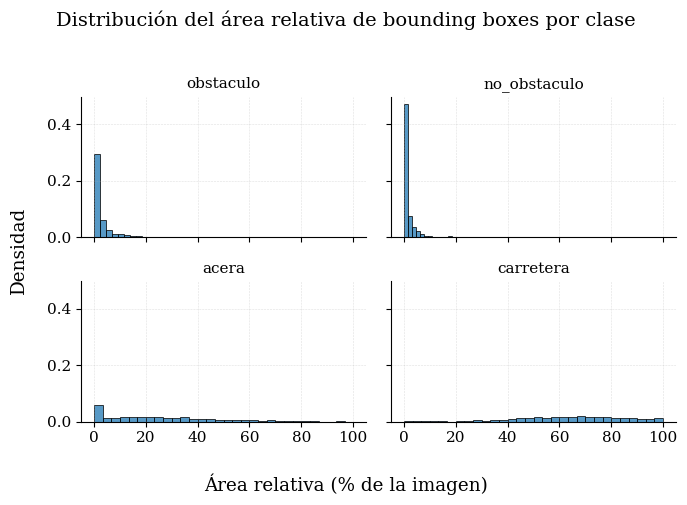

Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/dist_area_relativa_bounding_boxes_por_clase_color.pdf


In [ ]:
# Estilo
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 11
plt.rcParams["axes.linewidth"] = 0.8

classes = ["obstaculo", "no_obstaculo", "acera", "carretera"]

fig, axes = plt.subplots(2, 2, figsize=(7, 5), sharex=True, sharey=True)
axes = axes.flatten()

cmap = plt.get_cmap("tab10")
class_colors = {
    "obstaculo": cmap(0),     
    "no_obstaculo": cmap(0),  
    "acera": cmap(0),       
    "carretera": cmap(0),   
}

for ax, cls in zip(axes, classes):
    sub = df[df["class_name"] == cls]["box_area_rel"] * 100

    ax.hist(
        sub,
        bins=30,
        density=True,
        color=class_colors.get(cls, cmap(0)),
        edgecolor="black",
        linewidth=0.7,
        alpha=0.75
    )

    ax.set_title(cls, fontsize=11)
    ax.grid(True, linestyle="--", linewidth=0.4, alpha=0.4)

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

fig.suptitle("Distribución del área relativa de bounding boxes por clase", fontsize=14)
fig.supxlabel("Área relativa (% de la imagen)")
fig.supylabel("Densidad")

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# Guardar figura
output_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/dist_area_relativa_bounding_boxes_por_clase_color.pdf"
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Figura guardada en: {output_path}")

In [ ]:
target_classes = ["obstaculo", "no_obstaculo"]

df_anchor = df[df["class_name"].isin(target_classes)].copy()

X = df_anchor[["box_width_rel", "box_height_rel"]].values

X = X[(X[:,0] > 0) & (X[:,1] > 0)]

# K-means
k = 9
kmeans = KMeans(n_clusters=k, random_state=42, n_init=20)
kmeans.fit(X)

anchors = kmeans.cluster_centers_
anchors = anchors[np.argsort(anchors[:,0] * anchors[:,1])] 

anchors

array([[   0.027317,    0.051807],
       [   0.059256,     0.13621],
       [   0.073075,     0.26835],
       [   0.079908,     0.43841],
       [    0.19959,     0.18657],
       [    0.11027,     0.63337],
       [     0.3438,     0.33781],
       [    0.45046,     0.57539],
       [    0.84911,     0.41921]])

Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/anclas_kmeans_bounding_boxes.pdf


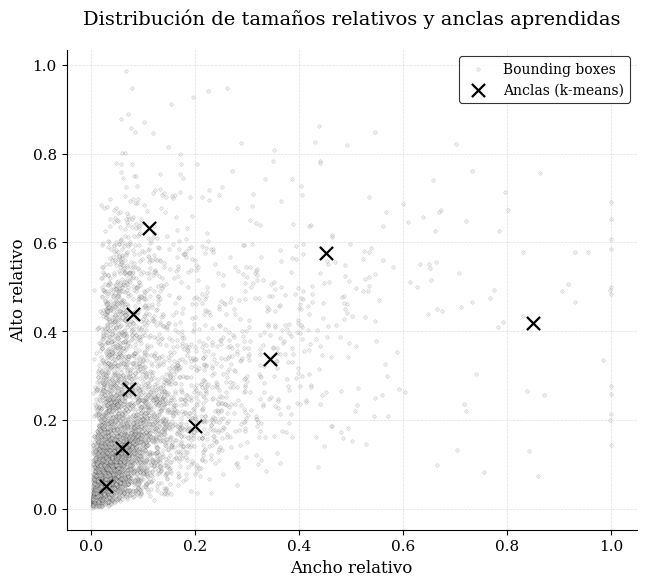

In [ ]:
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 11
plt.rcParams["axes.linewidth"] = 0.8

fig, ax = plt.subplots(figsize=(6.6, 6.0))

# Bounding boxes
ax.scatter(
    X[:, 0], X[:, 1],
    s=6,
    facecolors="lightgray",
    edgecolors="black",
    linewidths=0.2,
    alpha=0.35,
    label="Bounding boxes"
)

ax.scatter(
    anchors[:, 0], anchors[:, 1],
    s=90,
    c="black",
    marker="x",
    linewidths=1.6,
    label="Anclas (k-means)"
)

ax.set_xlabel("Ancho relativo", fontsize=12)
ax.set_ylabel("Alto relativo", fontsize=12)
ax.set_title("Distribución de tamaños relativos y anclas aprendidas", fontsize=14, pad=18)

ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.4)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

# Leyenda
leg = ax.legend(frameon=True, fontsize=10, loc="upper right")
leg.get_frame().set_edgecolor("black")
leg.get_frame().set_linewidth(0.8)

plt.tight_layout()

# Guardar
output_path = r"C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/anclas_kmeans_bounding_boxes.pdf"
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Figura guardada en: {output_path}")

plt.show()

##### 2.3 Análisis de truncamiento y borde de imagen

In [ ]:
# Truncamiento a borde
classes = ["obstaculo", "no_obstaculo", "acera", "carretera"]

df_tr = df[df["class_name"].isin(classes)].copy()

# Tolerancia (px)
EPS_PX = 2.0

W = df_tr["image_width"].astype(float)
H = df_tr["image_height"].astype(float)

df_tr["touch_left"]   = df_tr["xmin"] <= EPS_PX
df_tr["touch_top"]    = df_tr["ymin"] <= EPS_PX
df_tr["touch_right"]  = df_tr["xmax"] >= (W - EPS_PX)
df_tr["touch_bottom"] = df_tr["ymax"] >= (H - EPS_PX)

df_tr["touch_border"] = df_tr[["touch_left","touch_top","touch_right","touch_bottom"]].any(axis=1)

# Cuántos bordes toca cada box
df_tr["n_borders_touch"] = df_tr[["touch_left","touch_top","touch_right","touch_bottom"]].sum(axis=1)

df_tr.head(3)

,image_id,image_width,image_height,class_name,xmin,ymin,xmax,ymax,tipo_obstaculo,temporalidad,...,box_area_rel,cx_rel,cy_rel,box_aspect_ratio,touch_left,touch_top,touch_right,touch_bottom,touch_border,n_borders_touch
0,gsv-amsterdam-1071-Obstacle.png,1440.0,960.0,no_obstaculo,266.877470,0.0,433.833992,107.509881,NaN,NaN,...,0.012984,0.243303,0.055995,1.552941,False,True,False,False,True,1
1,gsv-amsterdam-1071-Obstacle.png,1440.0,960.0,no_obstaculo,135.335968,0.0,190.988142,118.893281,NaN,NaN,...,0.004786,0.113307,0.061924,0.468085,False,True,False,False,True,1
2,gsv-amsterdam-1071-Obstacle.png,1440.0,960.0,no_obstaculo,761.422925,0.0,809.486166,327.588933,NaN,NaN,...,0.011390,0.545455,0.170619,0.146718,False,True,False,False,True,1


In [173]:
# % truncadas (toca algún borde) por clase
summary = (
    df_tr.groupby("class_name")
         .agg(
             n_boxes=("class_name","size"),
             n_trunc=("touch_border","sum"),
             pct_trunc=("touch_border", lambda x: 100*x.mean()),
             pct_left=("touch_left", lambda x: 100*x.mean()),
             pct_right=("touch_right", lambda x: 100*x.mean()),
             pct_top=("touch_top", lambda x: 100*x.mean()),
             pct_bottom=("touch_bottom", lambda x: 100*x.mean()),
         )
         .reset_index()
)

summary

,class_name,n_boxes,n_trunc,pct_trunc,pct_left,pct_right,pct_top,pct_bottom
0,acera,1809,1477,81.647319,50.082919,48.866777,3.427308,13.709232
1,carretera,1277,1265,99.060298,81.205951,78.856695,5.716523,93.343774
2,no_obstaculo,2003,646,32.251623,4.043934,3.195207,26.560160,0.299551
3,obstaculo,3669,908,24.747888,4.633415,4.633415,17.552467,0.408831


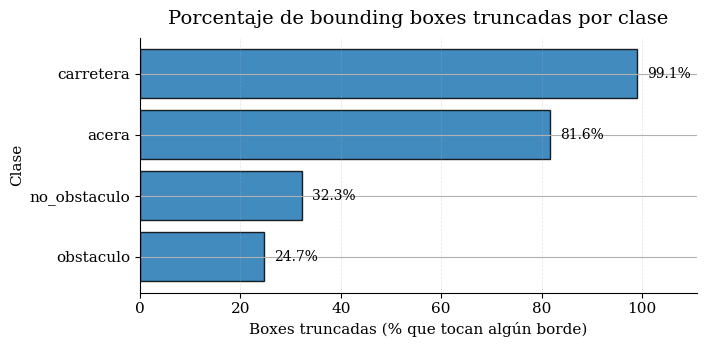

Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/porcentaje_bounding_boxes_truncadas_por_clase_color.pdf


In [ ]:
# Estilo
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 11
plt.rcParams["axes.linewidth"] = 0.8

# Gráfico de barras
order = summary.sort_values("pct_trunc", ascending=True)["class_name"]

fig, ax = plt.subplots(figsize=(7.2, 3.6))

vals = summary.set_index("class_name").loc[order, "pct_trunc"].values

blue = plt.get_cmap("tab10")(0)

bars = ax.barh(
    order,
    vals,
    color=blue,
    edgecolor="black",
    linewidth=1.0,
    alpha=0.85
)

xmax = float(vals.max()) if len(vals) else 0.0
xpad = max(0.6, 0.02 * xmax)

for b, v in zip(bars, vals):
    ax.text(
        float(v) + xpad,
        b.get_y() + b.get_height()/2,
        f"{v:.1f}%",
        va="center",
        fontsize=10,
        color="black"
    )

ax.set_title("Porcentaje de bounding boxes truncadas por clase", fontsize=14, pad=10)
ax.set_xlabel("Boxes truncadas (% que tocan algún borde)")
ax.set_ylabel("Clase")

ax.grid(True, axis="x", linestyle="--", linewidth=0.5, alpha=0.35)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

ax.set_xlim(0, xmax + 6 * xpad)

plt.tight_layout()
plt.show()

# Guardar figura
output_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/porcentaje_bounding_boxes_truncadas_por_clase_color.pdf"
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Figura guardada en: {output_path}")

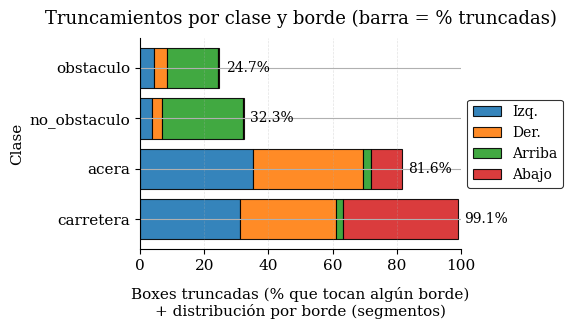

Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/distribucion_truncamientos_por_borde_y_clase_color.pdf


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl


# Estilo

mpl.rcParams.update({
    "font.family": "serif",
    "font.size": 11,
    "axes.titlesize": 13,
    "axes.labelsize": 11,
    "legend.fontsize": 10,
})

cols = ["pct_left", "pct_right", "pct_top", "pct_bottom"]
labels = ["Izq.", "Der.", "Arriba", "Abajo"]
order_full = ["carretera", "acera", "no_obstaculo", "obstaculo"]


df_plot = (
    summary
    .set_index("class_name")
    .reindex(order_full)
    .fillna(0)
    .copy()
)

# Detectar columna con "% que toca algún borde"
candidates = [
    "pct_any_border", "pct_any", "pct_truncated", "pct_trunc",
    "pct_touch_any", "pct_border_touch", "pct_boxes_truncated"
]

any_col = next((c for c in candidates if c in df_plot.columns), None)

if any_col is None:
    if ("n_any_border" in df_plot.columns) and ("n_total" in df_plot.columns):
        df_plot["pct_any_border"] = (
            100 * df_plot["n_any_border"] /
            df_plot["n_total"].replace(0, np.nan)
        )
        any_col = "pct_any_border"

    elif ("n_truncated" in df_plot.columns) and ("n_total" in df_plot.columns):
        df_plot["pct_any_border"] = (
            100 * df_plot["n_truncated"] /
            df_plot["n_total"].replace(0, np.nan)
        )
        any_col = "pct_any_border"

    else:
        raise ValueError("No encuentro la columna del % truncado ni conteos para calcularla.")

t = df_plot[any_col].fillna(0).clip(0, 100)


# Distribución relativa por borde
row_sum = df_plot[cols].sum(axis=1).replace(0, np.nan)
shares = df_plot[cols].div(row_sum, axis=0).fillna(0)

# Segmentos
M = shares.mul(t, axis=0)

fig, ax = plt.subplots(figsize=(7.2, 3.8))

left = np.zeros(len(M))

cmap = plt.get_cmap("tab10")
edge_colors = [cmap(0), cmap(1), cmap(2), cmap(3)]

for lab, c, colr in zip(labels, cols, edge_colors):
    vals = M[c].values
    ax.barh(
        M.index, vals, left=left,
        label=lab,
        color=colr,
        edgecolor="black", linewidth=0.8,
        alpha=0.90
    )
    left += vals

xmax = min(100, max(10, float(t.max()) * 1.20))
xpad = max(1.0, 0.02 * xmax)

for i, v in enumerate(t.values):
    ax.text(float(v) + xpad, i, f"{v:.1f}%", va="center", fontsize=10, color="black")

# Títulos
ax.set_title("Truncamientos por clase y borde (barra = % truncadas)", pad=10)
ax.set_xlabel(
    "Boxes truncadas (% que tocan algún borde)\n"
    "+ distribución por borde (segmentos)",
    labelpad=10
)
ax.set_ylabel("Clase")

# Limites
ax.set_xlim(0, min(100, xmax + 6 * xpad))

ax.grid(True, axis="x", linestyle="--", linewidth=0.5, alpha=0.35)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

# Leyenda
leg = ax.legend(
    frameon=True,
    loc="center left",
    bbox_to_anchor=(1.02, 0.5),
    borderaxespad=0.0
)
leg.get_frame().set_edgecolor("black")
leg.get_frame().set_linewidth(0.8)

fig.tight_layout(rect=[0, 0.10, 0.82, 1])
plt.show()

# Guardar
output_path = r"C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/distribucion_truncamientos_por_borde_y_clase_color.pdf"
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Figura guardada en: {output_path}")

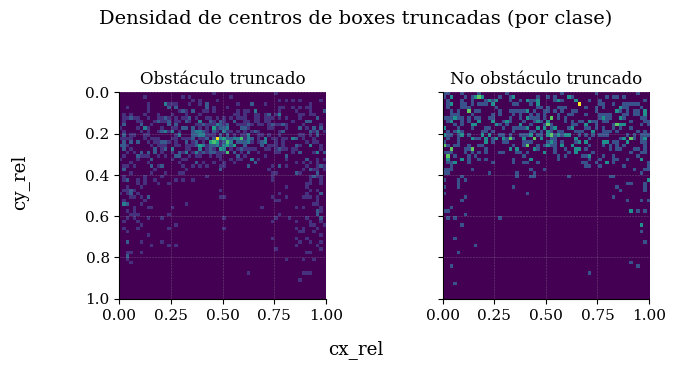

Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/densidad_centros_boxes_truncadas_por_clase.pdf


In [176]:
# Cálculo de centros relativos
df_tr["cx_rel"] = (df_tr["xmin"] + df_tr["xmax"]) / 2 / df_tr["image_width"]
df_tr["cy_rel"] = (df_tr["ymin"] + df_tr["ymax"]) / 2 / df_tr["image_height"]

def density_heatmap(ax, sub, title, bins=60):
    x = sub["cx_rel"].to_numpy()
    y = sub["cy_rel"].to_numpy()

    m = (x>=0) & (x<=1) & (y>=0) & (y<=1)
    x, y = x[m], y[m]

    H, _, _ = np.histogram2d(x, y, bins=bins, range=[[0,1],[0,1]])
    H = H.T
    ax.imshow(H, extent=[0,1,0,1], origin="lower", aspect="equal", interpolation="nearest")

    ax.set_title(title, fontsize=12)
    ax.set_xlim(0,1); ax.set_ylim(0,1)
    ax.invert_yaxis()
    ax.grid(True, linestyle="--", linewidth=0.4, alpha=0.4)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

df_trunc = df_tr[df_tr["touch_border"]].copy()

fig, axes = plt.subplots(1, 2, figsize=(7.2, 3.6), sharex=True, sharey=True)

density_heatmap(axes[0], df_trunc[df_trunc["class_name"]=="obstaculo"], "Obstáculo truncado")
density_heatmap(axes[1], df_trunc[df_trunc["class_name"]=="no_obstaculo"], "No obstáculo truncado")

fig.suptitle("Densidad de centros de boxes truncadas (por clase)", fontsize=14)
fig.supxlabel("cx_rel")
fig.supylabel("cy_rel")

plt.tight_layout(rect=[0,0,1,0.92])
plt.show()

# Guardar figura
output_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/densidad_centros_boxes_truncadas_por_clase.pdf"
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Figura guardada en: {output_path}")


##### 2.4 Solapamiento entre cajas (crowding) y oclusión aproximada

In [177]:
# Análisis de superposición entre boxes de "obstaculo" y "no_obstaculo"
target_classes = ["obstaculo", "no_obstaculo"]
df_crowd = df[df["class_name"].isin(target_classes)].copy()
df_crowd = df_crowd.reset_index(drop=True)

# Cálculo de centros relativos
boxes_all = df_crowd[["xmin","ymin","xmax","ymax"]].to_numpy(dtype=float)
classes_all = df_crowd["class_name"].to_numpy()
target_classes = ["obstaculo", "no_obstaculo"]
df_crowd = df[df["class_name"].isin(target_classes)].copy()
df_crowd = df_crowd.reset_index(drop=True)

boxes_all = df_crowd[["xmin","ymin","xmax","ymax"]].to_numpy(dtype=float)
classes_all = df_crowd["class_name"].to_numpy()

# Función IoU
def iou_one_to_many(box, boxes):
    x1 = np.maximum(box[0], boxes[:,0])
    y1 = np.maximum(box[1], boxes[:,1])
    x2 = np.minimum(box[2], boxes[:,2])
    y2 = np.minimum(box[3], boxes[:,3])

    iw = np.maximum(0.0, x2 - x1)
    ih = np.maximum(0.0, y2 - y1)
    inter = iw * ih

    area_box = (box[2]-box[0]) * (box[3]-box[1])
    area_boxes = (boxes[:,2]-boxes[:,0]) * (boxes[:,3]-boxes[:,1])
    union = area_box + area_boxes - inter

    return np.where(union > 0, inter / union, 0.0)


max_iou = np.zeros(len(df_crowd))
pair_type = np.array(["none"] * len(df_crowd), dtype=object)

for img_id, idx in df_crowd.groupby("image_id").indices.items():
    idx = np.array(idx, dtype=int)
    if len(idx) <= 1:
        continue

    boxes = boxes_all[idx]
    cls = classes_all[idx]

    for j, global_j in enumerate(idx):
        ious = iou_one_to_many(boxes[j], boxes)
        ious[j] = 0.0  # excluir self

        k = np.argmax(ious)
        max_iou[global_j] = ious[k]

        if ious[k] > 0:
            pair_type[global_j] = f"{cls[j]}-{cls[k]}"
            
df_crowd["max_iou_relevant"] = max_iou
df_crowd["crowd_pair"] = pair_type

summary_rel = (
    df_crowd.groupby("class_name")
    .agg(
        n_boxes=("class_name","size"),
        mean_max_iou=("max_iou_relevant","mean"),
        median_max_iou=("max_iou_relevant","median"),
        pct_iou_gt_01=("max_iou_relevant", lambda x: 100*(x > 0.10).mean()),
        pct_iou_gt_03=("max_iou_relevant", lambda x: 100*(x > 0.30).mean()),
    )
    .reset_index()
)

summary_rel

,class_name,n_boxes,mean_max_iou,median_max_iou,pct_iou_gt_01,pct_iou_gt_03
0,no_obstaculo,2003,0.074862,0.009896,24.762856,6.440339
1,obstaculo,3669,0.068095,0.009284,24.175525,4.769692


In [ ]:
# Estadísticas de pares con superposición
pair_stats = (
    df_crowd[df_crowd["max_iou_relevant"] > 0]
    .groupby("crowd_pair")
    .size()
    .reset_index(name="count")
)

pair_stats["percentage"] = 100 * pair_stats["count"] / pair_stats["count"].sum()

# Guardar tabla
pair_stats.to_latex("C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/tabla_pares_superposicion_obstaculo_no_obstaculo.tex")
print('Tabla de pares con superposición guardada en LaTeX.')

Tabla de pares con superposición guardada en LaTeX.


##### 2.5 Posición de los objetos (centros y heatmaps)

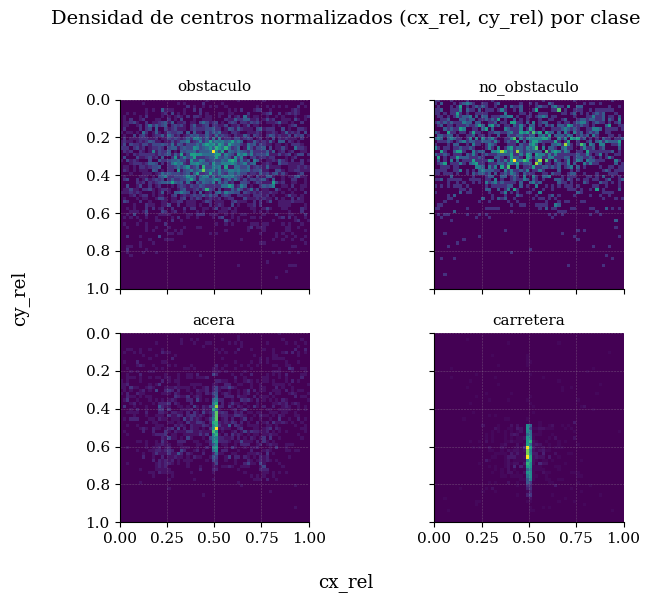

Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/densidad_centros_boxes_por_clase.pdf


In [179]:
# Estilo
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 11
plt.rcParams["axes.linewidth"] = 0.8

classes = ["obstaculo", "no_obstaculo", "acera", "carretera"]

fig, axes = plt.subplots(2, 2, figsize=(7, 6), sharex=True, sharey=True)
axes = axes.flatten()

bins = 60

for ax, cls in zip(axes, classes):
    sub = df[df["class_name"] == cls]
    if sub.empty:
        ax.set_title(f"{cls} (sin muestras)")
        ax.axis("off")
        continue

    x = sub["cx_rel"].to_numpy()
    y = sub["cy_rel"].to_numpy()

    H, xedges, yedges = np.histogram2d(x, y, bins=bins, range=[[0, 1], [0, 1]])
    H = H.T

    ax.imshow(
        H,
        extent=[0, 1, 0, 1],
        origin="lower",
        aspect="equal",
        interpolation="nearest"
    )

    ax.set_title(cls, fontsize=11)
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.invert_yaxis() 

    ax.grid(True, linestyle="--", linewidth=0.4, alpha=0.4)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

fig.suptitle("Densidad de centros normalizados (cx_rel, cy_rel) por clase", fontsize=14)
fig.supxlabel("cx_rel")
fig.supylabel("cy_rel")

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# Guardar figura
output_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/densidad_centros_boxes_por_clase.pdf"
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Figura guardada en: {output_path}")


In [ ]:
# Análisis de posición relativa de "obstaculo" y "no_obstaculo" respecto a "acera"
TARGET = ["obstaculo", "no_obstaculo"]

def iou(a, b):
    ax1, ay1, ax2, ay2 = a
    bx1, by1, bx2, by2 = b
    ix1, iy1 = max(ax1, bx1), max(ay1, by1)
    ix2, iy2 = min(ax2, bx2), min(ay2, by2)
    iw, ih = max(0, ix2 - ix1), max(0, iy2 - iy1)
    inter = iw * ih
    area_a = max(0, ax2-ax1) * max(0, ay2-ay1)
    area_b = max(0, bx2-bx1) * max(0, by2-by1)
    union = area_a + area_b - inter
    return inter / union if union > 0 else 0.0

def center_inside(cx, cy, box):
    x1,y1,x2,y2 = box
    return (x1 <= cx <= x2) and (y1 <= cy <= y2)

rows = []

for img_id, g in df.groupby("image_id"):
    sidewalks = g[g["class_name"] == "acera"]
    objs = g[g["class_name"].isin(TARGET)]

    if sidewalks.empty or objs.empty:
        continue

    s_boxes = sidewalks[["xmin","ymin","xmax","ymax"]].to_numpy()

    for _, r in objs.iterrows():
        o_box = r[["xmin","ymin","xmax","ymax"]].to_numpy()

        ious = np.array([iou(o_box, sb) for sb in s_boxes])
        best = int(np.argmax(ious))
        sb = s_boxes[best]

        cx = (r["xmin"] + r["xmax"]) / 2
        cy = (r["ymin"] + r["ymax"]) / 2

        sx1, sy1, sx2, sy2 = sb
        sw = max(1e-9, sx2 - sx1)
        sh = max(1e-9, sy2 - sy1)
        scx = (sx1 + sx2) / 2

        x_in = (cx - sx1) / sw
        y_in = (cy - sy1) / sh

        dist_left  = (cx - sx1) / sw
        dist_right = (sx2 - cx) / sw
        min_side_margin = min(dist_left, dist_right)

        center_offset = abs(cx - scx) / sw

        obj_w = max(1e-9, r["xmax"] - r["xmin"])
        obj_width_rel_sidewalk = obj_w / sw

        rows.append({
            "image_id": img_id,
            "class_name": r["class_name"],
            "iou_obj_sidewalk": float(ious[best]),
            "inside_sidewalk_center": bool(center_inside(cx, cy, sb)),
            "x_in_sidewalk": float(x_in),
            "y_in_sidewalk": float(y_in),
            "min_side_margin": float(min_side_margin),
            "center_offset": float(center_offset),
            "obj_width_rel_sidewalk": float(obj_width_rel_sidewalk),
        })

df_sw = pd.DataFrame(rows)
df_sw.head(3)

,image_id,class_name,iou_obj_sidewalk,inside_sidewalk_center,x_in_sidewalk,y_in_sidewalk,min_side_margin,center_offset,obj_width_rel_sidewalk
0,gsv-amsterdam-1071-Obstacle.png,no_obstaculo,0.018930,True,0.243303,0.081635,0.243303,0.256697,0.115942
1,gsv-amsterdam-1071-Obstacle.png,no_obstaculo,0.006978,True,0.113307,0.090279,0.113307,0.386693,0.038647
2,gsv-amsterdam-1071-Obstacle.png,no_obstaculo,0.016605,True,0.545455,0.248746,0.454545,0.045455,0.033377


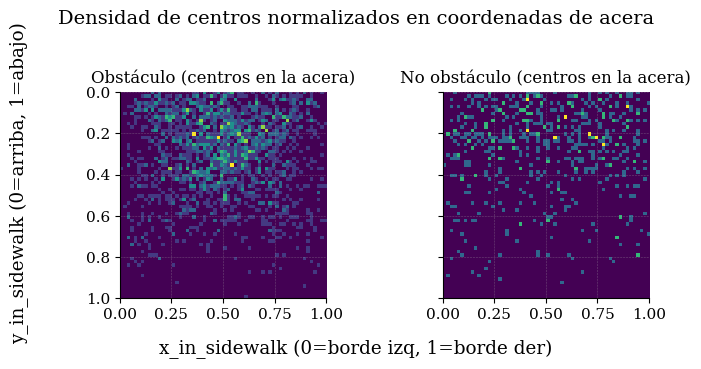

Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/densidad_centros_boxes_en_coordenadas_acera.pdf


In [ ]:
# Estilo
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 11
plt.rcParams["axes.linewidth"] = 0.8

def density_heatmap(ax, sub, title, bins=60, clip01=True):
    x = sub["x_in_sidewalk"].to_numpy()
    y = sub["y_in_sidewalk"].to_numpy()

    if clip01:
        m = (x >= 0) & (x <= 1) & (y >= 0) & (y <= 1)
        x, y = x[m], y[m]

    H, xedges, yedges = np.histogram2d(x, y, bins=bins, range=[[0, 1], [0, 1]])
    H = H.T 

    ax.imshow(
        H,
        extent=[0, 1, 0, 1],
        origin="lower",
        aspect="equal",
        interpolation="nearest"
    )

    ax.set_title(title, fontsize=12)
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.invert_yaxis()

    ax.grid(True, linestyle="--", linewidth=0.4, alpha=0.4)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

df_plot = df_sw[df_sw["iou_obj_sidewalk"] > 0.01].copy()

fig, axes = plt.subplots(1, 2, figsize=(7.2, 3.6), sharex=True, sharey=True)

density_heatmap(
    axes[0],
    df_plot[df_plot["class_name"] == "obstaculo"],
    "Obstáculo (centros en la acera)",
    bins=60
)

density_heatmap(
    axes[1],
    df_plot[df_plot["class_name"] == "no_obstaculo"],
    "No obstáculo (centros en la acera)",
    bins=60
)

fig.suptitle("Densidad de centros normalizados en coordenadas de acera", fontsize=14)
fig.supxlabel("x_in_sidewalk (0=borde izq, 1=borde der)")
fig.supylabel("y_in_sidewalk (0=arriba, 1=abajo)")

plt.tight_layout(rect=[0, 0, 1, 0.92])
plt.show()

# Guardar figura
output_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/densidad_centros_boxes_en_coordenadas_acera.pdf"
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Figura guardada en: {output_path}")

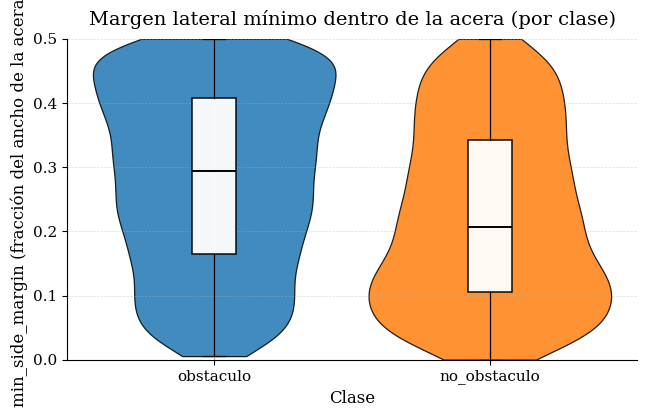

Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/margen_lateral_minimo_dentro_acera_por_clase_color.pdf


In [ ]:
# Estilo
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 11
plt.rcParams["axes.linewidth"] = 0.8

df_bp = df_sw[df_sw["inside_sidewalk_center"]].copy()

order = ["obstaculo", "no_obstaculo"]
data = [df_bp.loc[df_bp["class_name"] == c, "min_side_margin"].dropna().to_numpy() for c in order]

fig, ax = plt.subplots(figsize=(6.6, 4.3))

cmap = plt.get_cmap("tab10")
class_colors = {
    "obstaculo": cmap(0), 
    "no_obstaculo": cmap(1), 
}
colors = [class_colors.get(c, cmap(0)) for c in order]
positions = np.arange(1, len(order) + 1)

# Violín
vp = ax.violinplot(
    data,
    positions=positions,
    widths=0.88,
    showmeans=False,
    showmedians=False,
    showextrema=False,
    points=200,
    bw_method="scott",
)
for i, body in enumerate(vp["bodies"]):
    body.set_facecolor(colors[i])
    body.set_edgecolor("black")
    body.set_linewidth(0.9)
    body.set_alpha(0.85)

# Boxplot
bp = ax.boxplot(
    data,
    positions=positions,
    widths=0.16,
    patch_artist=True,
    showfliers=False, 
    manage_ticks=False,
    whis=1.5
)

for box in bp["boxes"]:
    box.set(facecolor="white", edgecolor="black", linewidth=1.1, alpha=0.95)
for whisker in bp["whiskers"]:
    whisker.set(color="black", linewidth=0.9)
for cap in bp["caps"]:
    cap.set(color="black", linewidth=0.9)
for median in bp["medians"]:
    median.set(color="black", linewidth=1.4)

ax.set_xticks(positions)
ax.set_xticklabels(order)

ax.set_title("Margen lateral mínimo dentro de la acera (por clase)", fontsize=14, pad=10)
ax.set_xlabel("Clase", fontsize=12)
ax.set_ylabel("min_side_margin (fracción del ancho de la acera)", fontsize=12)

ax.set_ylim(0, 0.5)
ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.45, axis="y")
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.tight_layout()
plt.show()

# Guardar figura
output_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/margen_lateral_minimo_dentro_acera_por_clase_color.pdf"
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Figura guardada en: {output_path}")

In [ ]:
# Parámetros heurística
ALPHA = 0.25

HREL_THR = 0.18       
AR_THR   = 0.55         
BETA_VERTICAL = 0.5

IOU_MIN = 0.02

TARGET = ["obstaculo", "no_obstaculo"]

# Helpers
def iou(a, b):
    ax1, ay1, ax2, ay2 = a
    bx1, by1, bx2, by2 = b
    ix1, iy1 = max(ax1, bx1), max(ay1, by1)
    ix2, iy2 = min(ax2, bx2), min(ay2, by2)
    iw, ih = max(0, ix2 - ix1), max(0, iy2 - iy1)
    inter = iw * ih
    area_a = max(0, ax2-ax1) * max(0, ay2-ay1)
    area_b = max(0, bx2-bx1) * max(0, by2-by1)
    union = area_a + area_b - inter
    return inter / union if union > 0 else 0.0

def center_inside(cx, cy, box):
    x1, y1, x2, y2 = box
    return (x1 <= cx <= x2) and (y1 <= cy <= y2)

def safe_box(box):
    x1, y1, x2, y2 = map(float, box)
    if x2 < x1: x1, x2 = x2, x1
    if y2 < y1: y1, y2 = y2, y1
    return np.array([x1, y1, x2, y2], dtype=float)

rows = []

for img_id, g in df.groupby("image_id"):
    sidewalks = g[g["class_name"] == "acera"].copy()
    objs = g[g["class_name"].isin(TARGET)].copy()
    if sidewalks.empty or objs.empty:
        continue

    s_boxes = sidewalks[["xmin", "ymin", "xmax", "ymax"]].to_numpy(dtype=float)
    s_boxes = np.array([safe_box(b) for b in s_boxes])

    for _, r in objs.iterrows():
        full_box = safe_box(r[["xmin","ymin","xmax","ymax"]].to_numpy(dtype=float))
        ox1, oy1, ox2, oy2 = full_box
        ow = max(1e-9, ox2-ox1)
        oh = max(1e-9, oy2-oy1)

        hrel = float(r["box_height_rel"])
        ar   = float(r["box_aspect_ratio"]) 

        is_vertical = (hrel > HREL_THR) and (ar < AR_THR)

        # use_box
        if is_vertical:
            beta = BETA_VERTICAL
            y_base = oy2 - ALPHA * oh
            fy1, fy2 = y_base, oy2

            cx_full = (ox1 + ox2) / 2
            new_w = beta * ow
            fx1 = cx_full - new_w/2
            fx2 = cx_full + new_w/2

            use_box = safe_box([fx1, fy1, fx2, fy2])
        else:
            beta = 1.0
            use_box = full_box.copy()

        # acera elegida por IoU(use_box, acera)
        ious_use = np.array([iou(use_box, sb) for sb in s_boxes])
        best = int(np.argmax(ious_use))
        chosen_sidewalk = s_boxes[best]
        iou_use_sidewalk = float(ious_use[best])

        sx1, sy1, sx2, sy2 = chosen_sidewalk
        sw = max(1e-9, sx2-sx1)
        sh = max(1e-9, sy2-sy1)
        scx = (sx1 + sx2) / 2 

        # validación 
        ucx = (use_box[0] + use_box[2]) / 2
        ucy = (use_box[1] + use_box[3]) / 2
        valid_sidewalk = (iou_use_sidewalk > IOU_MIN) and center_inside(ucx, ucy, chosen_sidewalk)

        # y en coords de acera (centro en Y)
        y_in = (ucy - sy1) / sh

        # intersección objeto∩acera en X
        ix1 = max(use_box[0], sx1)
        ix2 = min(use_box[2], sx2)

        if ix2 > ix1:
            x_invasion_center = (ix1 + ix2) / 2
            x_invasion_rel = (x_invasion_center - sx1) / sw
            invasion_width_rel = (ix2 - ix1) / sw

            # márgenes libres reales a izquierda/derecha del obstáculo dentro de la acera
            left_free_rel  = (ix1 - sx1) / sw
            right_free_rel = (sx2 - ix2) / sw

            # borde "interior" (edge of intrusion): el que mira al centro de la acera
            # si el objeto está a la izquierda del centro → borde interior = ix2 (derecho)
            # si está a la derecha → borde interior = ix1 (izquierdo)
            x_inner = ix2 if x_invasion_center < scx else ix1
            x_inner_rel = (x_inner - sx1) / sw

            # x que usaremos en heatmap
            # - vertical: x_inner_rel (representa la “intrusión” real)
            # - no vertical: centro de invasión
            if is_vertical:
                x_for_heatmap = x_inner_rel
            else:
                x_for_heatmap = x_invasion_rel

            # métricas de “paso”:
            # - min_free = peor lado (si hay un lado muy estrecho)
            # - max_free = mejor lado (si existe un lado con paso suficiente)
            min_free_rel = min(left_free_rel, right_free_rel)
            max_free_rel = max(left_free_rel, right_free_rel)

        else:
            x_invasion_rel = np.nan
            invasion_width_rel = 0.0
            left_free_rel = np.nan
            right_free_rel = np.nan
            x_inner_rel = np.nan
            x_for_heatmap = (ucx - sx1) / sw  # fallback
            min_free_rel = np.nan
            max_free_rel = np.nan

        obj_width_rel_sidewalk_full = (full_box[2] - full_box[0]) / sw
        obj_width_rel_sidewalk_use  = (use_box[2]  - use_box[0])  / sw

        rows.append({
            "image_id": img_id,
            "class_name": r["class_name"],

            "alpha": ALPHA,
            "beta": beta,
            "is_vertical": bool(is_vertical),

            "iou_use_sidewalk": iou_use_sidewalk,
            "valid_sidewalk": bool(valid_sidewalk),
            "chosen_sidewalk_idx": best,

            "sidewalk_boxes": s_boxes,
            "chosen_sidewalk": chosen_sidewalk,
            "full_box": full_box,
            "use_box": use_box,

            "y_in_sidewalk_use": float(y_in),

            "x_invasion_rel": float(x_invasion_rel) if not np.isnan(x_invasion_rel) else np.nan,
            "x_inner_rel": float(x_inner_rel) if not np.isnan(x_inner_rel) else np.nan,
            "x_for_heatmap": float(x_for_heatmap),

            "invasion_width_rel": float(invasion_width_rel),
            "left_free_rel": float(left_free_rel) if not np.isnan(left_free_rel) else np.nan,
            "right_free_rel": float(right_free_rel) if not np.isnan(right_free_rel) else np.nan,
            "min_free_rel": float(min_free_rel) if not np.isnan(min_free_rel) else np.nan,
            "max_free_rel": float(max_free_rel) if not np.isnan(max_free_rel) else np.nan,

            "obj_width_rel_sidewalk_full": float(obj_width_rel_sidewalk_full),
            "obj_width_rel_sidewalk_use": float(obj_width_rel_sidewalk_use),
        })

df_debug = pd.DataFrame(rows)
print("df_debug shape:", df_debug.shape)
df_debug.head(3)

df_debug shape: (5672, 23)


,image_id,class_name,alpha,beta,is_vertical,iou_use_sidewalk,valid_sidewalk,chosen_sidewalk_idx,sidewalk_boxes,chosen_sidewalk,...,x_invasion_rel,x_inner_rel,x_for_heatmap,invasion_width_rel,left_free_rel,right_free_rel,min_free_rel,max_free_rel,obj_width_rel_sidewalk_full,obj_width_rel_sidewalk_use
0,gsv-amsterdam-1071-Obstacle.png,no_obstaculo,0.25,1.0,False,0.018930,False,0,"[[0.0, 0.0, 1440.0000000000002, 658.4802431610...","[0.0, 0.0, 1440.0000000000002, 658.4802431610942]",...,0.243303,0.301274,0.243303,0.115942,0.185332,0.698726,0.185332,0.698726,0.115942,0.115942
1,gsv-amsterdam-1071-Obstacle.png,no_obstaculo,0.25,1.0,False,0.006978,False,0,"[[0.0, 0.0, 1440.0000000000002, 658.4802431610...","[0.0, 0.0, 1440.0000000000002, 658.4802431610942]",...,0.113307,0.132631,0.113307,0.038647,0.093983,0.867369,0.093983,0.867369,0.038647,0.038647
2,gsv-amsterdam-1071-Obstacle.png,no_obstaculo,0.25,0.5,True,0.002076,False,0,"[[0.0, 0.0, 1440.0000000000002, 658.4802431610...","[0.0, 0.0, 1440.0000000000002, 658.4802431610942]",...,0.545455,0.537110,0.537110,0.016689,0.537110,0.446201,0.446201,0.537110,0.033377,0.016689


In [ ]:
# Visualización de ejemplos individuales
RAW_DIR = os.path.join("..", "data", "images", "all")

def draw_box(ax, box, lw=2, ls="-", alpha=1.0):
    x1, y1, x2, y2 = box
    ax.add_patch(Rectangle((x1, y1), x2-x1, y2-y1, fill=False,
                           linewidth=lw, linestyle=ls, alpha=alpha))

def plot_debug_example(df_debug, image_id, row_idx=0):
    ex = df_debug[(df_debug["image_id"] == image_id) & (df_debug["valid_sidewalk"])].iloc[row_idx]
    img_path = os.path.join(RAW_DIR, image_id)
    img = Image.open(img_path).convert("RGB")

    fig, ax = plt.subplots(figsize=(10, 6))
    ax.imshow(img)
    ax.axis("off")

    for sb in ex["sidewalk_boxes"]:
        draw_box(ax, sb, lw=1.2, alpha=0.25)

    sw_box = ex["chosen_sidewalk"]
    draw_box(ax, sw_box, lw=2.8)

    draw_box(ax, ex["full_box"], lw=2.0, ls="--")
    draw_box(ax, ex["use_box"], lw=2.8)

    use_box = ex["use_box"]
    sx1, sy1, sx2, sy2 = sw_box
    sw = (sx2 - sx1)
    sh = (sy2 - sy1)

    ucx = (use_box[0] + use_box[2]) / 2
    ucy = (use_box[1] + use_box[3]) / 2
    ax.plot([ucx], [ucy], marker="o", markersize=6)

    ix1 = max(use_box[0], sx1)
    ix2 = min(use_box[2], sx2)
    if ix2 > ix1:
        x_inv = (ix1 + ix2) / 2
        ax.plot([ix1, ix2], [ucy, ucy], linewidth=3)    
        ax.plot([x_inv], [ucy], marker="x", markersize=9) 

        if pd.notnull(ex["x_inner_rel"]):
            x_inner = sx1 + ex["x_inner_rel"] * sw
            ax.plot([x_inner], [ucy], marker="^", markersize=9)

    x_hm = sx1 + ex["x_for_heatmap"] * sw
    y_hm = sy1 + ex["y_in_sidewalk_use"] * sh
    ax.plot([x_hm], [y_hm], marker="*", markersize=12)

    ax.set_title(
        f"{image_id} | {ex['class_name']} | vertical={ex['is_vertical']} | α={ex['alpha']}, β={ex['beta']}\n"
        f"x_for_heatmap={ex['x_for_heatmap']:.3f}, y_in={ex['y_in_sidewalk_use']:.3f} | "
        f"invasion_w={ex['invasion_width_rel']:.3f} | max_free={ex['max_free_rel']:.3f} | IoU={ex['iou_use_sidewalk']:.3f}",
        fontsize=11
    )

    plt.tight_layout()
    plt.show()


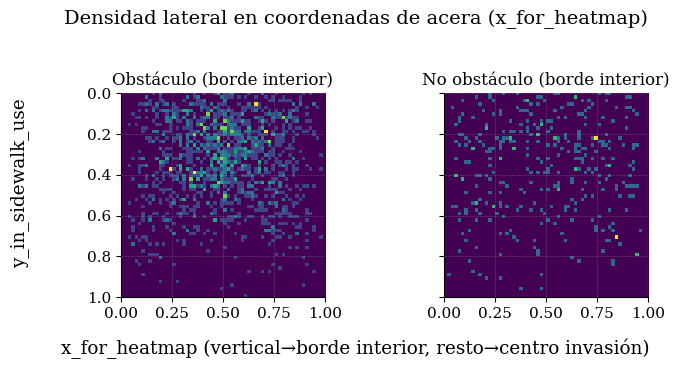

Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/densidad_lateral_boxes_en_coordenadas_acera_heuristica.pdf


In [185]:
# Estilo
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 11
plt.rcParams["axes.linewidth"] = 0.8

# Gráficos de densidad heatmap en coordenadas de acera
def density_heatmap(ax, sub, title, bins=60):
    x = sub["x_for_heatmap"].to_numpy()
    y = sub["y_in_sidewalk_use"].to_numpy()

    m = (~np.isnan(x)) & (x >= 0) & (x <= 1) & (y >= 0) & (y <= 1)
    x, y = x[m], y[m]

    H, _, _ = np.histogram2d(x, y, bins=bins, range=[[0, 1], [0, 1]])
    H = H.T

    ax.imshow(H, extent=[0,1,0,1], origin="lower", aspect="equal", interpolation="nearest")
    ax.set_title(title, fontsize=12)
    ax.set_xlim(0,1)
    ax.set_ylim(0,1)
    ax.invert_yaxis()
    ax.grid(True, linestyle="--", linewidth=0.4, alpha=0.4)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

df_plot = df_debug[df_debug["valid_sidewalk"]].copy()

fig, axes = plt.subplots(1, 2, figsize=(7.2, 3.6), sharex=True, sharey=True)

density_heatmap(axes[0], df_plot[df_plot["class_name"]=="obstaculo"], "Obstáculo (borde interior)")
density_heatmap(axes[1], df_plot[df_plot["class_name"]=="no_obstaculo"], "No obstáculo (borde interior)")

fig.suptitle("Densidad lateral en coordenadas de acera (x_for_heatmap)", fontsize=14)
fig.supxlabel("x_for_heatmap (vertical→borde interior, resto→centro invasión)")
fig.supylabel("y_in_sidewalk_use")

plt.tight_layout(rect=[0,0,1,0.92])
plt.show()

# Guardar figura
output_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/densidad_lateral_boxes_en_coordenadas_acera_heuristica.pdf"
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Figura guardada en: {output_path}")

In [ ]:
# Visualización detallada de ejemplos individuales con heatmap
RAW_DIR = os.path.join("..", "data", "images", "all")

from matplotlib.patches import Rectangle
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os

def draw_box(ax, box, lw=2, ls="-", alpha=1.0):
    x1, y1, x2, y2 = box
    ax.add_patch(Rectangle((x1, y1), x2-x1, y2-y1, fill=False,
                           linewidth=lw, linestyle=ls, alpha=alpha))

def show_heatmap_input(df_debug, image_id, k=0):
    """
    Muestra el k-ésimo objeto (válido) dentro de esa imagen.
    """
    sub = df_debug[(df_debug["image_id"] == image_id) & (df_debug["valid_sidewalk"])].reset_index(drop=True)
    if sub.empty:
        print("No hay objetos válidos en esa imagen.")
        return
    if k >= len(sub):
        print(f"k={k} fuera de rango. Esta imagen tiene {len(sub)} objetos válidos.")
        return

    ex = sub.iloc[k]

    img_path = os.path.join(RAW_DIR, image_id)
    if not os.path.exists(img_path):
        raise FileNotFoundError(f"No encuentro la imagen: {img_path}")

    img = Image.open(img_path).convert("RGB")

    fig, ax = plt.subplots(figsize=(10, 6))
    ax.imshow(img)
    ax.axis("off")

    # Aceras 
    for sb in ex["sidewalk_boxes"]:
        draw_box(ax, sb, lw=1.2, alpha=0.25)    
    sw_box = ex["chosen_sidewalk"]
    draw_box(ax, sw_box, lw=2.8, alpha=1.0)  

    # --- Objeto ---
    draw_box(ax, ex["full_box"], lw=2.0, ls="--") 
    use_box = ex["use_box"]
    draw_box(ax, use_box, lw=2.8)            

    sx1, sy1, sx2, sy2 = sw_box
    sw = max(1e-9, sx2 - sx1)
    sh = max(1e-9, sy2 - sy1)
    scx = (sx1 + sx2) / 2

    # Puntos
    ucx = (use_box[0] + use_box[2]) / 2
    ucy = (use_box[1] + use_box[3]) / 2
    ax.plot([ucx], [ucy], marker="o", markersize=6)

    ix1 = max(use_box[0], sx1)
    ix2 = min(use_box[2], sx2)
    if ix2 > ix1:
        ax.plot([ix1, ix2], [ucy, ucy], linewidth=3)    
        x_inv = (ix1 + ix2) / 2
        ax.plot([x_inv], [ucy], marker="x", markersize=9)

        x_inner = ix2 if x_inv < scx else ix1
        ax.plot([x_inner], [ucy], marker="^", markersize=9)

    x_hm = sx1 + ex["x_for_heatmap"] * sw
    y_hm = sy1 + ex["y_in_sidewalk_use"] * sh
    ax.plot([x_hm], [y_hm], marker="*", markersize=12)

    ax.set_title(
        f"{image_id} | {ex['class_name']} | vertical={ex['is_vertical']} | α={ex['alpha']}, β={ex['beta']}\n"
        f"★ heatmap: x_for_heatmap={ex['x_for_heatmap']:.3f}, y_in={ex['y_in_sidewalk_use']:.3f} | "
        f"min_free={ex['min_free_rel'] if 'min_free_rel' in ex else np.nan} | max_free={ex['max_free_rel'] if 'max_free_rel' in ex else np.nan} | "
        f"IoU={ex['iou_use_sidewalk']:.3f}",
        fontsize=11
    )

    plt.tight_layout()
    plt.show()

    display(sub[["class_name","is_vertical","iou_use_sidewalk","x_for_heatmap","y_in_sidewalk_use",
                 "x_invasion_rel","x_inner_rel","invasion_width_rel"]].head(10))


In [ ]:
df_hm = df_debug[df_debug["valid_sidewalk"]].copy()

cand = df_hm[df_hm["is_vertical"] & (df_hm["invasion_width_rel"] > 0.10)].copy()
cand = cand.sort_values("invasion_width_rel", ascending=False).head(10)

cand[["image_id","class_name","invasion_width_rel","x_for_heatmap","x_inner_rel","x_invasion_rel","iou_use_sidewalk"]]

,image_id,class_name,invasion_width_rel,x_for_heatmap,x_inner_rel,x_invasion_rel,iou_use_sidewalk
1272,gsv-cdmx-82-Obstacle.png,obstaculo,0.880401,0.880401,0.880401,0.440201,0.293000
3332,gsv-oradell-7866-Obstacle.png,no_obstaculo,0.689038,0.689038,0.689038,0.344519,0.203572
3301,gsv-oradell-7692-Obstacle.png,no_obstaculo,0.287297,0.569055,0.569055,0.712703,0.143999
3909,gsv-seattle-128938-Obstacle.png,no_obstaculo,0.278311,0.417466,0.417466,0.278311,0.153183
1566,gsv-chicago-17962-Obstacle.png,obstaculo,0.273506,0.538039,0.538039,0.401287,0.203368
590,gsv-amsterdam-587-Obstacle.png,no_obstaculo,0.267339,0.376135,0.376135,0.509804,0.047299
566,gsv-amsterdam-574-Obstacle.png,obstaculo,0.251770,0.375834,0.375834,0.501720,0.096127
595,gsv-amsterdam-588-Obstacle.png,obstaculo,0.229973,0.344959,0.344959,0.229973,0.047583
22,gsv-amsterdam-1117-Obstacle.png,obstaculo,0.228168,0.538123,0.538123,0.424038,0.047098
5280,gsv-spgg-63460-Obstacle.png,no_obstaculo,0.223975,0.563091,0.563091,0.451104,0.029499


C:\Users\joano\AppData\Local\Temp\ipykernel_9068\577657339.py:88: UserWarning: Glyph 9733 (\N{BLACK STAR}) missing from font(s) DejaVu Serif.
  plt.tight_layout()
c:\Users\joano\anaconda3\envs\va-sidewalks\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 9733 (\N{BLACK STAR}) missing from font(s) DejaVu Serif.
  fig.canvas.print_figure(bytes_io, **kw)


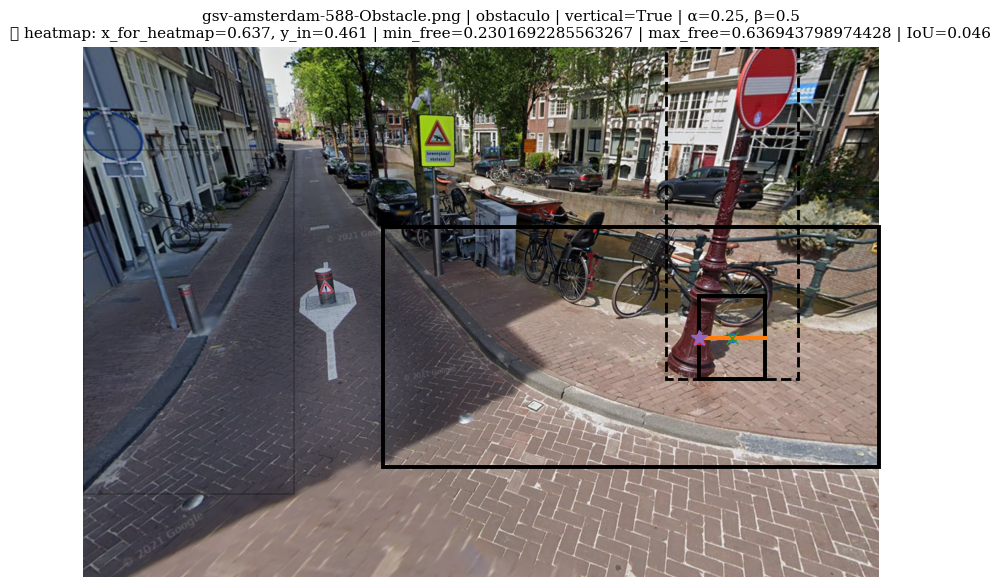

,class_name,is_vertical,iou_use_sidewalk,x_for_heatmap,y_in_sidewalk_use,x_invasion_rel,x_inner_rel,invasion_width_rel
0,obstaculo,True,0.045966,0.636944,0.461190,0.703387,0.636944,0.132887
1,obstaculo,True,0.047583,0.344959,0.426365,0.229973,0.344959,0.229973
2,obstaculo,False,0.052064,0.364127,0.125795,0.364127,0.445985,0.163716
3,obstaculo,False,0.133695,0.620834,0.187978,0.620834,0.461702,0.318264
4,obstaculo,False,0.128336,0.451816,0.250254,0.451816,0.710456,0.517279
5,obstaculo,False,0.027754,0.778088,0.116589,0.778088,0.654684,0.246809


Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/debug_ejemplo_real_heuristica_heatmap_v2.pdf


In [188]:
img_id = cand["image_id"].iloc[7]
show_heatmap_input(df_debug, img_id, k=0)

# Guardar imagen
output_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/debug_ejemplo_real_heuristica_heatmap_v2.pdf"
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Figura guardada en: {output_path}")

##### 2.6 Consistencia obstáculo vs no obstáculo según “clearance proxy”

In [ ]:
df_q = df_debug[
    (df_debug["valid_sidewalk"]) &
    (df_debug["class_name"].isin(["obstaculo", "no_obstaculo"]))
].copy()

df_q = df_q[
    df_q["max_free_rel"].notna() &
    df_q["min_free_rel"].notna() &
    (df_q["max_free_rel"] >= 0) & (df_q["max_free_rel"] <= 1) &
    (df_q["min_free_rel"] >= 0) & (df_q["min_free_rel"] <= 1)
].copy()

df_q["is_obstaculo"] = (df_q["class_name"] == "obstaculo").astype(int)

df_q[["class_name","max_free_rel","min_free_rel"]].head()

,class_name,max_free_rel,min_free_rel
3,no_obstaculo,0.812637,0.061327
8,no_obstaculo,0.749456,0.194912
12,obstaculo,0.676439,0.095818
14,obstaculo,0.655924,0.000000
15,no_obstaculo,0.621657,0.282516


C:\Users\joano\AppData\Local\Temp\ipykernel_9068\4033029686.py:8: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(
C:\Users\joano\AppData\Local\Temp\ipykernel_9068\4033029686.py:8: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(


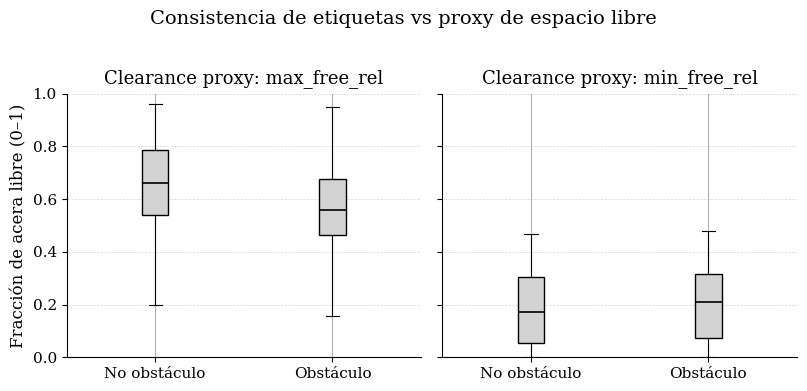

Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/boxplots_clearance_proxy_por_clase.pdf


In [ ]:
# Estilo
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 11
plt.rcParams["axes.linewidth"] = 0.8

# Función auxiliar para boxplot
def _styled_boxplot(ax, data, labels, title, ylabel):
    bp = ax.boxplot(
        data, labels=labels, patch_artist=True, showfliers=False
    )
    for box in bp["boxes"]:
        box.set(facecolor="lightgray", edgecolor="black", linewidth=1.0)
    for whisker in bp["whiskers"]:
        whisker.set(color="black", linewidth=0.8)
    for cap in bp["caps"]:
        cap.set(color="black", linewidth=0.8)
    for med in bp["medians"]:
        med.set(color="black", linewidth=1.2)

    ax.set_title(title, fontsize=13, pad=8)
    ax.set_ylabel(ylabel, fontsize=12)
    ax.set_ylim(0, 1)
    ax.grid(True, axis="y", linestyle="--", linewidth=0.5, alpha=0.5)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

fig, axes = plt.subplots(1, 2, figsize=(8.2, 3.8), sharey=True)

order = ["no_obstaculo", "obstaculo"]
labels = ["No obstáculo", "Obstáculo"]

data_max = [df_q[df_q["class_name"] == c]["max_free_rel"].values for c in order]
data_min = [df_q[df_q["class_name"] == c]["min_free_rel"].values for c in order]

_styled_boxplot(
    axes[0], data_max, labels,
    title="Clearance proxy: max_free_rel",
    ylabel="Fracción de acera libre (0–1)"
)
_styled_boxplot(
    axes[1], data_min, labels,
    title="Clearance proxy: min_free_rel",
    ylabel=""
)

fig.suptitle("Consistencia de etiquetas vs proxy de espacio libre", fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

# Guardar figura
output_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/boxplots_clearance_proxy_por_clase.pdf"
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Figura guardada en: {output_path}")

Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/curva_obstaculo_vs_max_free_rel.pdf


C:\Users\joano\AppData\Local\Temp\ipykernel_9068\3950539474.py:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_q.groupby("bin")


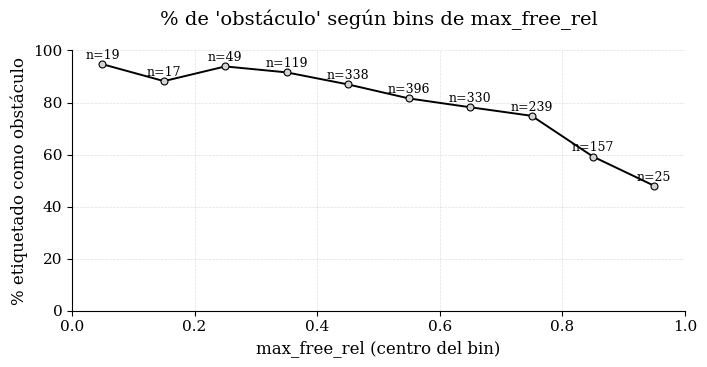

,bin,n,pct_obstaculo,mean_max_free,bin_center
0,"(-0.001, 0.1]",19,94.736842,0.017313,0.0495
1,"(0.1, 0.2]",17,88.235294,0.156132,0.1500
2,"(0.2, 0.3]",49,93.877551,0.261451,0.2500
3,"(0.3, 0.4]",119,91.596639,0.356858,0.3500
4,"(0.4, 0.5]",338,86.982249,0.459696,0.4500
5,"(0.5, 0.6]",396,81.565657,0.548761,0.5500
6,"(0.6, 0.7]",330,78.181818,0.648678,0.6500
7,"(0.7, 0.8]",239,74.895397,0.746903,0.7500
8,"(0.8, 0.9]",157,59.235669,0.841611,0.8500
9,"(0.9, 1.0]",25,48.000000,0.918581,0.9500


In [ ]:
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 11
plt.rcParams["axes.linewidth"] = 0.8

n_bins = 10
bins = np.linspace(0, 1, n_bins + 1)

df_q["bin"] = pd.cut(df_q["max_free_rel"], bins=bins, include_lowest=True)

curve = (
    df_q.groupby("bin")
        .agg(
            n=("is_obstaculo", "size"),
            pct_obstaculo=("is_obstaculo", lambda x: 100*x.mean()),
            mean_max_free=("max_free_rel", "mean")
        )
        .reset_index()
)

bin_centers = []
for interval in curve["bin"]:
    bin_centers.append((interval.left + interval.right) / 2)
curve["bin_center"] = bin_centers

fig, ax = plt.subplots(figsize=(7.2, 3.8))

ax.plot(
    curve["bin_center"],
    curve["pct_obstaculo"],
    color="black",
    linewidth=1.4,
    marker="o",
    markersize=5,
    markerfacecolor="lightgray",
    markeredgecolor="black",
    markeredgewidth=0.8
)

for x, y, n in zip(curve["bin_center"], curve["pct_obstaculo"], curve["n"]):
    y_text = min(y + 2.0, 98.0) 
    ax.text(x, y_text, f"n={n}", ha="center", fontsize=9, color="black")

ax.set_title("% de 'obstáculo' según bins de max_free_rel", fontsize=14, pad=18)
ax.set_xlabel("max_free_rel (centro del bin)", fontsize=12)
ax.set_ylabel("% etiquetado como obstáculo", fontsize=12)

ax.set_xlim(0, 1)
ax.set_ylim(0, 100)
ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.4)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.tight_layout()

# Guardar figura
output_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/curva_obstaculo_vs_max_free_rel.pdf"
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Figura guardada en: {output_path}")

plt.show()

curve

In [ ]:
# Resúmenes estadísticos por clase
def summarize_by_class(df_in, col):
    out = (df_in.groupby("class_name")[col]
           .quantile([0.1, 0.25, 0.5, 0.75, 0.9])
           .unstack()
           .rename(columns={0.1:"p10",0.25:"p25",0.5:"p50",0.75:"p75",0.9:"p90"})
          )
    return out

print("=== max_free_rel percentiles ===")
display(summarize_by_class(df_q, "max_free_rel"))

# Guardar tabla
table_max_free = summarize_by_class(df_q, "max_free_rel")
latex_max_free = table_max_free.to_latex(float_format="%.3f")
output_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/tabla_percentiles_max_free_rel.tex"
with open(output_path, "w") as f:
    f.write(latex_max_free)
print(f"Tabla guardada en: {output_path}")

print("=== min_free_rel percentiles ===")
display(summarize_by_class(df_q, "min_free_rel"))

# Guardar tabla
table_min_free = summarize_by_class(df_q, "min_free_rel")
latex_min_free = table_min_free.to_latex(float_format="%.3f")
output_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/tabla_percentiles_min_free_rel.tex"
with open(output_path, "w") as f:
    f.write(latex_min_free)
print(f"Tabla guardada en: {output_path}")

# Umbrales para ver consistencia
for thr in [0.30, 0.50]:
    tmp = df_q.copy()
    tmp["is_low_clearance"] = (tmp["max_free_rel"] < thr).astype(int)
    stats_thr = (
        tmp.groupby("class_name")["is_low_clearance"]
           .mean()
           .mul(100)
           .rename(f"% con max_free_rel < {thr}")
           .to_frame()
    )
    print(f"\n=== Umbral max_free_rel < {thr} ===")
    display(stats_thr)
    
    # Guardar tabla
    latex_stats = stats_thr.to_latex(float_format="%.2f")
    output_path = f"C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/tabla_porcentaje_low_clearance_max_free_rel_{int(thr*100)}.tex"
    with open(output_path, "w") as f:
        f.write(latex_stats)
    print(f"Tabla guardada en: {output_path}")


=== max_free_rel percentiles ===


,p10,p25,p50,p75,p90
class_name,,,,,
no_obstaculo,0.454541,0.537912,0.659848,0.785204,0.862121
obstaculo,0.363389,0.465358,0.556719,0.676032,0.778020


Tabla guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/tabla_percentiles_max_free_rel.tex
=== min_free_rel percentiles ===


,p10,p25,p50,p75,p90
class_name,,,,,
no_obstaculo,0.0,0.055817,0.171564,0.303112,0.380411
obstaculo,0.0,0.072510,0.207900,0.314393,0.381534


Tabla guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/tabla_percentiles_min_free_rel.tex

=== Umbral max_free_rel < 0.3 ===


,% con max_free_rel < 0.3
class_name,
no_obstaculo,1.754386
obstaculo,5.864885


Tabla guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/tabla_porcentaje_low_clearance_max_free_rel_30.tex

=== Umbral max_free_rel < 0.5 ===


,% con max_free_rel < 0.5
class_name,
no_obstaculo,17.543860
obstaculo,35.783222


Tabla guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/tabla_porcentaje_low_clearance_max_free_rel_50.tex


#### **3. Análisis de atributos de los obstáculos**

In [193]:
# Inspección rápida de obstáculos anotados
obst = df[df["class_name"] == "obstaculo"].copy()
print(len(obst), "obstáculos anotados")
obst.head(3)

3669 obstáculos anotados


,image_id,image_width,image_height,class_name,xmin,ymin,xmax,ymax,tipo_obstaculo,temporalidad,...,box_width,box_height,box_area,img_area,box_width_rel,box_height_rel,box_area_rel,cx_rel,cy_rel,box_aspect_ratio
9,gsv-amsterdam-1105-Obstacle.png,1440.0,960.0,obstaculo,529.960474,260.553360,578.023715,531.225296,obstaculo_farola_poste,temporalidad_fijo,...,48.063241,270.671937,13009.370557,1382400.0,0.033377,0.281950,0.009411,0.384717,0.412385,0.177570
10,gsv-amsterdam-1105-Obstacle.png,1440.0,960.0,obstaculo,596.996047,435.098814,624.822134,536.284585,obstaculo_señal,temporalidad_temporal,...,27.826087,101.185771,2815.604056,1382400.0,0.019324,0.105402,0.002037,0.424242,0.505929,0.275000
15,gsv-amsterdam-1109-Obstacle.png,1440.0,960.0,obstaculo,428.774704,356.679842,824.664032,564.110672,obstaculo_residuos,temporalidad_temporal,...,395.889328,207.430830,82119.651924,1382400.0,0.274923,0.216074,0.059404,0.435222,0.479578,1.908537


##### 3.1 Distribución de cada atributo

[OK] C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/distribucion_tipo_obstaculo_obstaculos_color.pdf


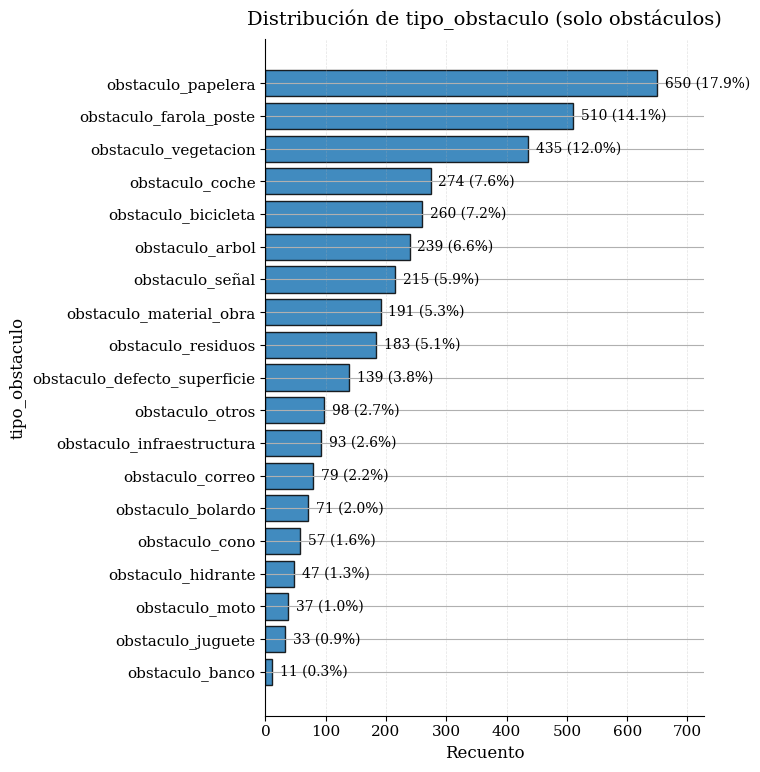

[OK] C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/distribucion_severidad_obstaculos_color.pdf


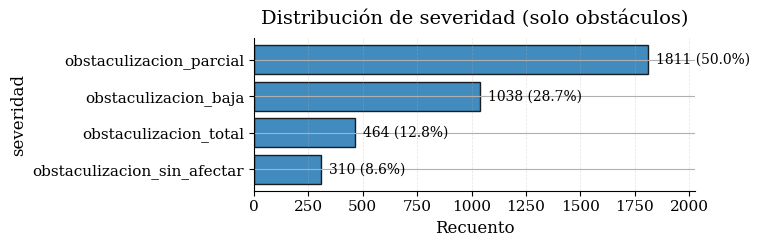

[OK] C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/distribucion_visibilidad_obstaculos_color.pdf


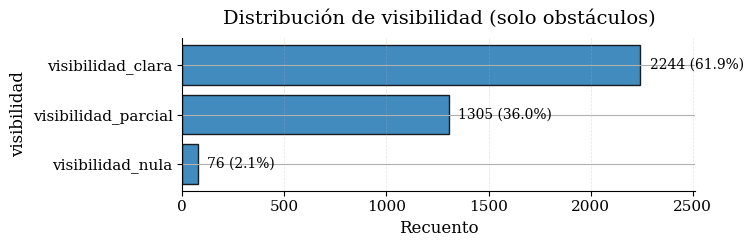

[OK] C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/distribucion_temporalidad_obstaculos_color.pdf


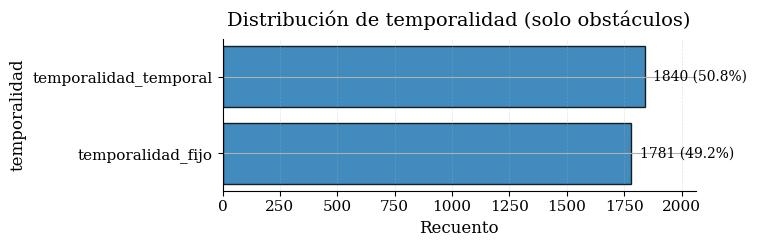

[OK] C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/distribucion_altura_obstaculos_color.pdf


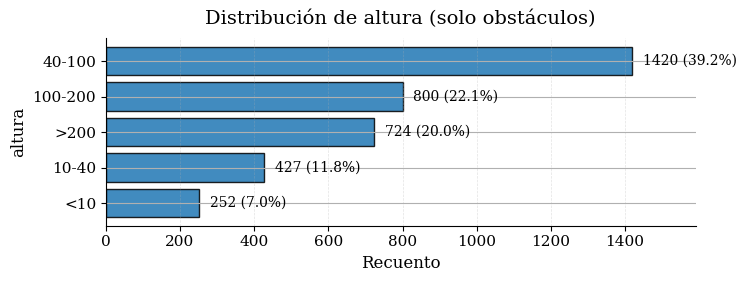

[OK] C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/distribucion_anotacion_obstaculos_color.pdf


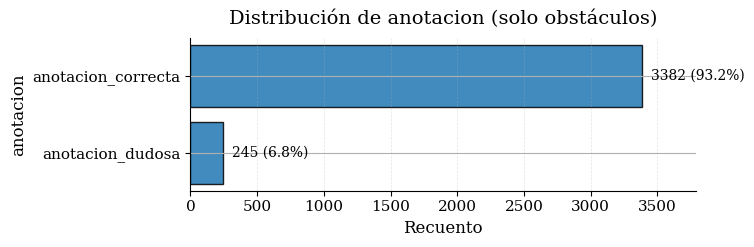

Distribuciones guardadas.


In [ ]:
# Estilo
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 11
plt.rcParams["axes.linewidth"] = 0.8

attr_cols = ["tipo_obstaculo", "severidad", "visibilidad", "temporalidad", "altura", "anotacion"]

def plot_attr_distribution(df_in, col, title=None, min_count=1, max_categories=25, save_path=None):
    s = df_in[col].copy()

    s = s.astype("string")
    s = s.replace(r"^\s*$", pd.NA, regex=True)
    s = s.replace({"nan": pd.NA, "None": pd.NA, "Sin etiqueta": pd.NA})
    s = s.dropna()

    vc = s.value_counts()
    if vc.empty:
        return

    vc = vc[vc >= min_count]
    if vc.empty:
        return

    if len(vc) > max_categories:
        top = vc.iloc[:max_categories]
        rest = vc.iloc[max_categories:].sum()
        vc = top.copy()
        vc.loc["Otros"] = rest

    total = vc.sum()
    pct = 100 * vc / total

    vc = vc.sort_values(ascending=True)
    pct = pct.loc[vc.index]

    fig_h = max(2.6, 0.35 * len(vc) + 1.2)
    fig, ax = plt.subplots(figsize=(7.6, fig_h))

    blue = plt.get_cmap("tab10")(0)

    bars = ax.barh(
        vc.index, vc.values,
        color=blue,
        edgecolor="black",
        linewidth=1.0,
        alpha=0.85
    )

    x_max = float(vc.max()) if len(vc) else 0.0
    xpad = max(1.0, 0.02 * x_max)

    for bar, n, p in zip(bars, vc.values, pct.values):
        ax.text(
            bar.get_width() + xpad,
            bar.get_y() + bar.get_height()/2,
            f"{int(n)} ({p:.1f}%)",
            va="center",
            fontsize=10,
            color="black"
        )

    ax.set_title(title or f"Distribución de {col} (solo obstáculos)", fontsize=14, pad=10)
    ax.set_xlabel("Recuento", fontsize=12)
    ax.set_ylabel(col, fontsize=12)

    ax.grid(True, axis="x", linestyle="--", linewidth=0.5, alpha=0.35)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    ax.set_xlim(0, x_max + 6 * xpad)

    plt.tight_layout()

    if save_path:
        save_path_color = str(save_path).replace(".pdf", "_color.pdf")
        fig.savefig(save_path_color, dpi=300, bbox_inches="tight")
        print(f"[OK] {save_path_color}")

    plt.show()
    plt.close(fig)

for col in attr_cols:
    plot_attr_distribution(
        obst,
        col,
        title=f"Distribución de {col} (solo obstáculos)",
        min_count=1,
        max_categories=25,
        save_path=f"C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/distribucion_{col}_obstaculos.pdf"
    )

print("Distribuciones guardadas.")

##### 3.2 Co-ocurrencias entre atributos

[OK] C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/heatmap_tipo_obstaculo_vs_severidad_frecuencia_color.pdf


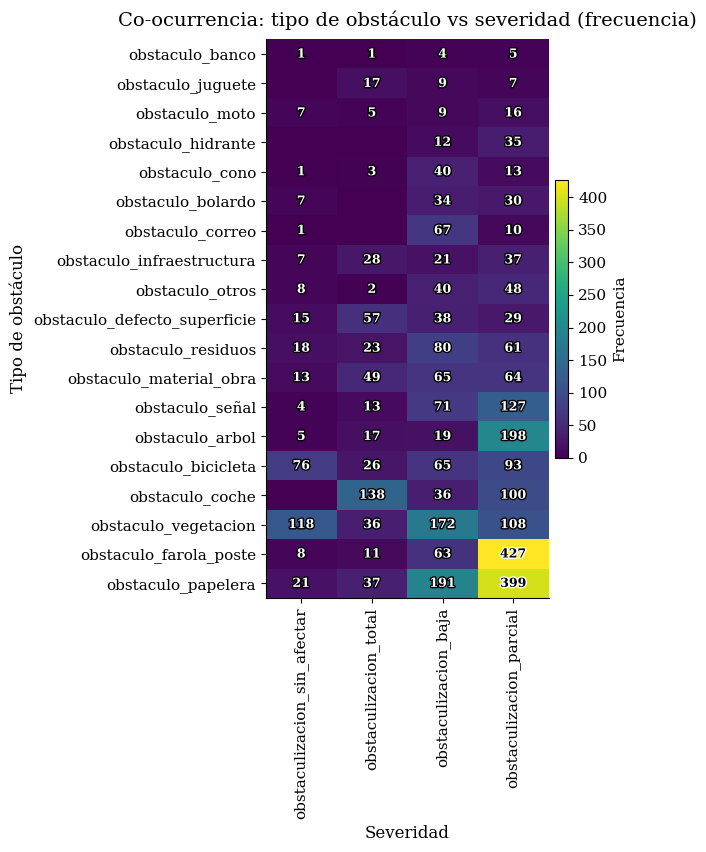

[OK] C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/heatmap_tipo_obstaculo_vs_severidad_color.pdf


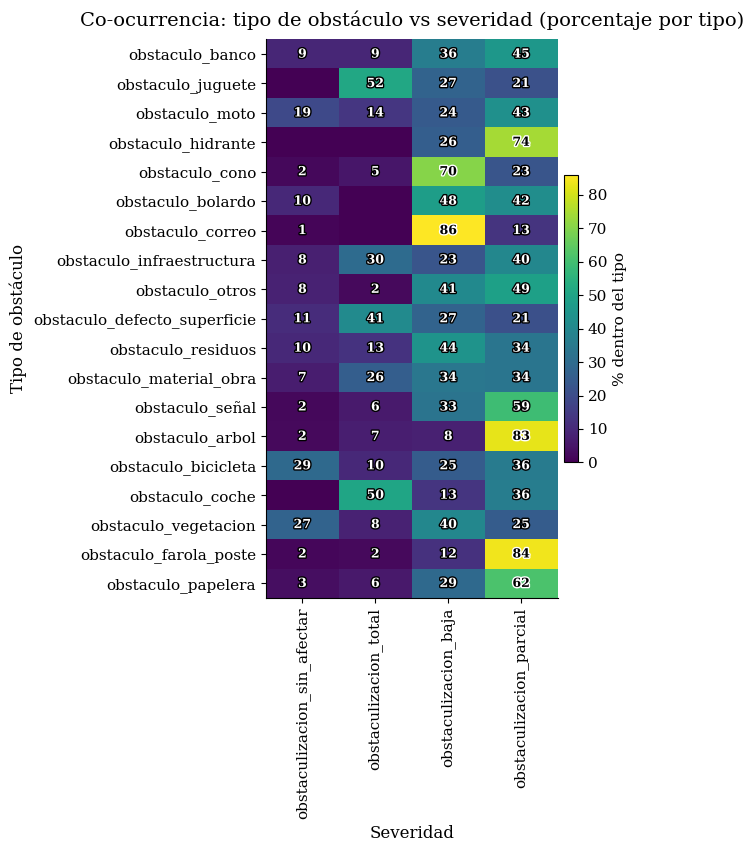

Heatmaps guardados.


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.colors import LogNorm
import matplotlib.patheffects as pe

# Estilo
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 11
plt.rcParams["axes.linewidth"] = 0.8


# Helper
def clean_unlabeled(s: pd.Series) -> pd.Series:
    """
    Elimina valores sin etiqueta:
    - NaN / <NA>
    - strings vacíos o solo espacios
    - 'nan', 'None', 'Sin etiqueta' (case-insensitive)
    """
    s = s.astype("string")
    s = s.replace(r"^\s*$", pd.NA, regex=True)
    s = s.where(~s.str.strip().str.lower().isin({"nan", "none", "sin etiqueta"}), pd.NA)
    return s.dropna()

# Tabla de contingencia
tipo = clean_unlabeled(obst["tipo_obstaculo"])
sev  = clean_unlabeled(obst["severidad"])

tmp = pd.DataFrame({"tipo_obstaculo": tipo, "severidad": sev}).dropna()
ct = pd.crosstab(tmp["tipo_obstaculo"], tmp["severidad"])

MIN_TOTAL = 5
ct = ct.loc[ct.sum(axis=1) >= MIN_TOTAL, ct.sum(axis=0) >= MIN_TOTAL]

ct = ct.loc[
    ct.sum(axis=1).sort_values(ascending=True).index,
    ct.sum(axis=0).sort_values(ascending=True).index
]

def plot_heatmap_paper(
    M: pd.DataFrame,
    title: str,
    xlabel: str,
    ylabel: str,
    annotate: bool = True,
    log_scale: bool = False,
    cbar_label: str = "Frecuencia",
    save_path: str | None = None,
    show_cell_grid: bool = False, 
):
    """
    Heatmap paper-ready (color) con anotaciones legibles.
    - Números con color por contraste real + contorno (stroke)
    - Rejilla entre celdas desactivada por defecto
    """
    nrows, ncols = M.shape
    if nrows == 0 or ncols == 0:
        print(f"[WARN] Matriz vacía para: {title}")
        return

    fig_w = max(6.5, 0.55 * ncols + 2.5)
    fig_h = max(3.8, 0.35 * nrows + 2.0)
    fig, ax = plt.subplots(figsize=(fig_w, fig_h))

    data = M.values.astype(float)

    cmap = plt.get_cmap("viridis")

    if log_scale:
        vmin = max(1.0, np.min(data[data > 0]) if np.any(data > 0) else 1.0)
        vmax = np.max(data) if np.max(data) > 0 else 1.0
        im = ax.imshow(
            data,
            aspect="auto",
            interpolation="nearest",
            cmap=cmap,
            norm=LogNorm(vmin=vmin, vmax=vmax),
        )
    else:
        im = ax.imshow(
            data,
            aspect="auto",
            interpolation="nearest",
            cmap=cmap,
        )

    ax.set_xticks(np.arange(ncols))
    ax.set_yticks(np.arange(nrows))
    ax.set_xticklabels(M.columns, rotation=90)
    ax.set_yticklabels(M.index)

    ax.set_title(title, fontsize=14, pad=10)
    ax.set_xlabel(xlabel, fontsize=12)
    ax.set_ylabel(ylabel, fontsize=12)

    ax.grid(False)

    if show_cell_grid:
        ax.set_xticks(np.arange(-.5, ncols, 1), minor=True)
        ax.set_yticks(np.arange(-.5, nrows, 1), minor=True)
        ax.grid(which="minor", color="white", linestyle="-", linewidth=0.35, alpha=0.18)
        ax.tick_params(which="minor", bottom=False, left=False)
    else:
        ax.set_xticks([], minor=True)
        ax.set_yticks([], minor=True)

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.02)
    cbar.set_label(cbar_label, fontsize=11)

    if annotate and (nrows * ncols <= 300):
        for i in range(nrows):
            for j in range(ncols):
                v = data[i, j]
                if not np.isfinite(v) or v == 0:
                    continue

                r, g, b, a = im.cmap(im.norm(v))

                lum = 0.2126 * r + 0.7152 * g + 0.0722 * b

                txt_color = "black" if lum > 0.62 else "white"
                outline = "white" if txt_color == "black" else "black"

                ax.text(
                    j, i, f"{int(round(v))}",
                    ha="center", va="center",
                    fontsize=9,
                    fontweight="bold",
                    color=txt_color,
                    path_effects=[pe.withStroke(linewidth=2.0, foreground=outline)]
                )

    plt.tight_layout()

    if save_path:
        save_path_color = str(save_path).replace(".pdf", "_color.pdf")
        fig.savefig(save_path_color, dpi=300, bbox_inches="tight")
        print(f"[OK] {save_path_color}")

    plt.show()
    plt.close(fig)

# Figura A: Frecuencia absoluta
plot_heatmap_paper(
    ct,
    title="Co-ocurrencia: tipo de obstáculo vs severidad (frecuencia)",
    xlabel="Severidad",
    ylabel="Tipo de obstáculo",
    annotate=True,
    log_scale=False,
    cbar_label="Frecuencia",
    save_path="C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/heatmap_tipo_obstaculo_vs_severidad_frecuencia.pdf",
    show_cell_grid=False
)

# Figura B: Normalizado por fila
ct_row = ct.div(ct.sum(axis=1).replace(0, np.nan), axis=0) * 100
ct_row = ct_row.fillna(0)

plot_heatmap_paper(
    ct_row,
    title="Co-ocurrencia: tipo de obstáculo vs severidad (porcentaje por tipo)",
    xlabel="Severidad",
    ylabel="Tipo de obstáculo",
    annotate=True,
    log_scale=False,
    cbar_label="% dentro del tipo",
    save_path="C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/heatmap_tipo_obstaculo_vs_severidad.pdf",
    show_cell_grid=False
)

print("Heatmaps guardados.")

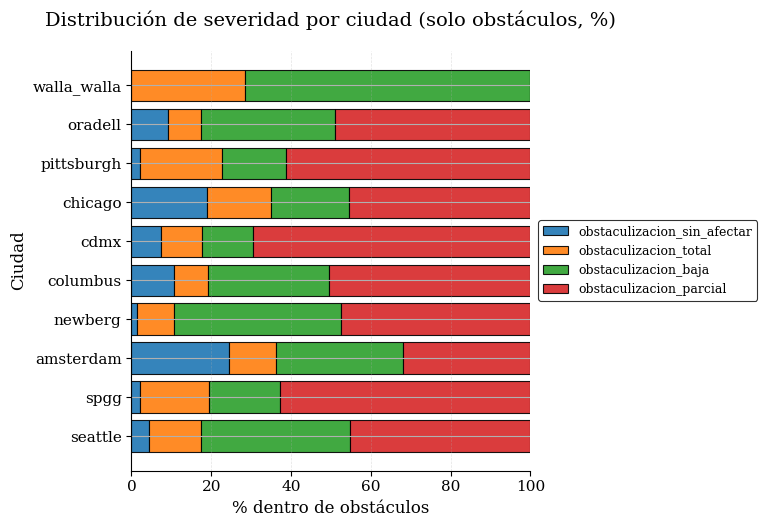

Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/distribucion_severidad_por_ciudad_obstaculos_color.pdf


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Helper
def clean_unlabeled(s: pd.Series) -> pd.Series:
    """
    Elimina valores sin etiqueta:
    - NaN / <NA>
    - strings vacíos o solo espacios
    - 'nan', 'None', 'Sin etiqueta' (case-insensitive)
    """
    s = s.astype("string")
    s = s.replace(r"^\s*$", pd.NA, regex=True)
    s = s.where(~s.str.strip().str.lower().isin({"nan", "none", "sin etiqueta"}), pd.NA)
    return s.dropna()

# Distribución de severidad por ciudad (solo obstáculos)
obst = df_city[df_city["class_name"] == "obstaculo"].copy()

sev_clean  = clean_unlabeled(obst["severidad"])
city_clean = clean_unlabeled(obst["city"])

tmp = pd.DataFrame({"city": city_clean, "severidad": sev_clean}).dropna()

ct_sev = pd.crosstab(tmp["city"], tmp["severidad"])
ct_sev["total"] = ct_sev.sum(axis=1)
ct_sev = ct_sev.sort_values("total", ascending=False).drop(columns=["total"])

TOP_N = 15
if len(ct_sev) > TOP_N:
    ct_sev = ct_sev.iloc[:TOP_N]

ct_sev_pct = ct_sev.div(ct_sev.sum(axis=1).replace(0, np.nan), axis=0) * 100
ct_sev_pct = ct_sev_pct.fillna(0)

col_order = ct_sev.sum(axis=0).sort_values(ascending=True).index
ct_sev_pct = ct_sev_pct[col_order]

# Estilo
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 11
plt.rcParams["axes.linewidth"] = 0.8

fig_h = max(3.6, 0.38 * len(ct_sev_pct) + 1.6)
fig, ax = plt.subplots(figsize=(9.6, fig_h))


cmap = plt.get_cmap("tab10")
colors = [cmap(i) for i in range(len(ct_sev_pct.columns))]

left = np.zeros(len(ct_sev_pct))
for i, sev in enumerate(ct_sev_pct.columns):
    vals = ct_sev_pct[sev].values
    ax.barh(
        ct_sev_pct.index, vals, left=left,
        color=colors[i],
        edgecolor="black", linewidth=0.8,
        alpha=0.90,
        label=str(sev)
    )
    left += vals

ax.set_title("Distribución de severidad por ciudad (solo obstáculos, %)", fontsize=14, pad=18)
ax.set_xlabel("% dentro de obstáculos", fontsize=12)
ax.set_ylabel("Ciudad", fontsize=12)

ax.set_xlim(0, 100)
ax.grid(True, axis="x", linestyle="--", linewidth=0.5, alpha=0.35)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

leg = ax.legend(
    frameon=True,
    fontsize=9,
    loc="center left",
    bbox_to_anchor=(1.02, 0.5),
    borderaxespad=0.0
)
leg.get_frame().set_edgecolor("black")
leg.get_frame().set_linewidth(0.8)

fig.tight_layout(rect=[0.0, 0.0, 0.82, 1.0])
plt.show()

# Guardar figura
output_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/distribucion_severidad_por_ciudad_obstaculos_color.pdf"
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Figura guardada en: {output_path}")

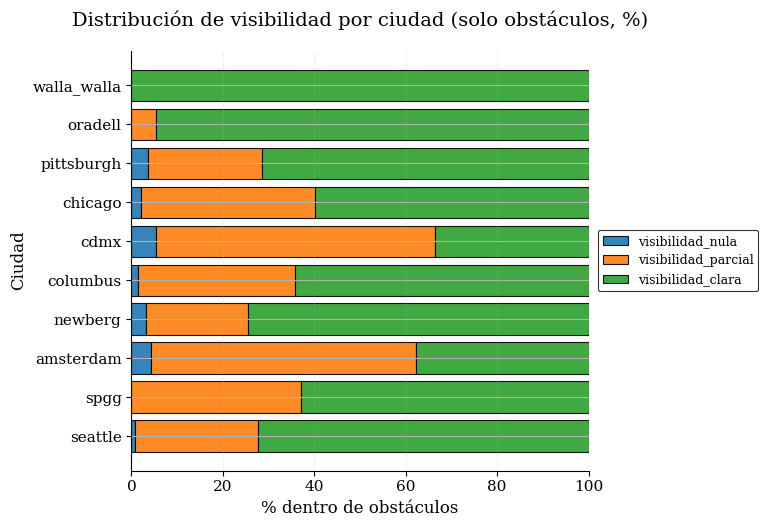

Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/distribucion_visibilidad_por_ciudad_obstaculos_color.pdf


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Helper
def clean_unlabeled(s: pd.Series) -> pd.Series:
    """
    Elimina valores sin etiqueta:
    - NaN / <NA>
    - strings vacíos o solo espacios
    - 'nan', 'None', 'Sin etiqueta' (case-insensitive)
    """
    s = s.astype("string")
    s = s.replace(r"^\s*$", pd.NA, regex=True)
    s = s.where(~s.str.strip().str.lower().isin({"nan", "none", "sin etiqueta"}), pd.NA)
    return s.dropna()


# Distribución de visibilidad por ciudad (solo obstáculos)
vis_clean  = clean_unlabeled(obst["visibilidad"])
city_clean = clean_unlabeled(obst["city"])

tmp = pd.DataFrame({"city": city_clean, "visibilidad": vis_clean}).dropna()

ct_vis = pd.crosstab(tmp["city"], tmp["visibilidad"])
ct_vis["total"] = ct_vis.sum(axis=1)
ct_vis = ct_vis.sort_values("total", ascending=False).drop(columns=["total"])

TOP_N = 15
if len(ct_vis) > TOP_N:
    ct_vis = ct_vis.iloc[:TOP_N]

ct_vis_pct = ct_vis.div(ct_vis.sum(axis=1).replace(0, np.nan), axis=0) * 100
ct_vis_pct = ct_vis_pct.fillna(0)

col_order = ct_vis.sum(axis=0).sort_values(ascending=True).index
ct_vis_pct = ct_vis_pct[col_order]

# Estilo
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 11
plt.rcParams["axes.linewidth"] = 0.8

fig_h = max(3.6, 0.38 * len(ct_vis_pct) + 1.6)
fig, ax = plt.subplots(figsize=(9.6, fig_h))

cmap = plt.get_cmap("tab10")
colors = [cmap(i) for i in range(len(ct_vis_pct.columns))]

left = np.zeros(len(ct_vis_pct))
for i, vis in enumerate(ct_vis_pct.columns):
    vals = ct_vis_pct[vis].values
    ax.barh(
        ct_vis_pct.index, vals, left=left,
        color=colors[i],
        edgecolor="black", linewidth=0.8,
        alpha=0.90,
        label=str(vis)
    )
    left += vals

ax.set_title("Distribución de visibilidad por ciudad (solo obstáculos, %)", fontsize=14, pad=18)
ax.set_xlabel("% dentro de obstáculos", fontsize=12)
ax.set_ylabel("Ciudad", fontsize=12)

ax.set_xlim(0, 100)
ax.grid(True, axis="x", linestyle="--", linewidth=0.5, alpha=0.35)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

leg = ax.legend(
    frameon=True,
    fontsize=9,
    loc="center left",
    bbox_to_anchor=(1.02, 0.5),
    borderaxespad=0.0
)
leg.get_frame().set_edgecolor("black")
leg.get_frame().set_linewidth(0.8)

fig.tight_layout(rect=[0.0, 0.0, 0.82, 1.0])
plt.show()

# Guardar figura
output_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/distribucion_visibilidad_por_ciudad_obstaculos_color.pdf"
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Figura guardada en: {output_path}")

##### 3.3 Atributos vs tamaño/posición

In [198]:
# Estilo
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 11
plt.rcParams["axes.linewidth"] = 0.8

obst = df[df["class_name"] == "obstaculo"].copy()

# Limpieza de categorías
def clean_cat(s):
    s = s.fillna("Sin etiqueta").astype(str)
    s = s.replace({"": "Sin etiqueta", "nan": "Sin etiqueta", "None": "Sin etiqueta"})
    return s

obst["severidad"] = clean_cat(obst["severidad"])
obst["visibilidad"] = clean_cat(obst["visibilidad"])

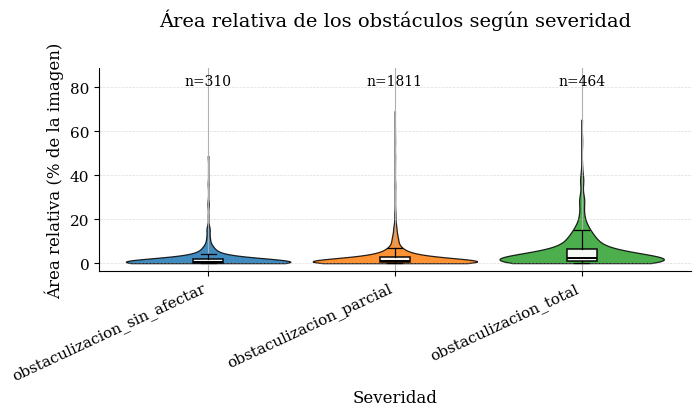

Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/boxplot_area_relativa_obstaculos_severidad_color.pdf


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Helper
def clean_unlabeled(s: pd.Series) -> pd.Series:
    """
    Elimina valores sin etiqueta:
    - NaN / <NA>
    - strings vacíos o solo espacios
    - 'nan', 'None', 'Sin etiqueta' (case-insensitive)
    """
    s = s.astype("string")
    s = s.replace(r"^\s*$", pd.NA, regex=True)
    s = s.where(~s.str.strip().str.lower().isin({"nan", "none", "sin etiqueta"}), pd.NA)
    return s.dropna()

# Violin
if "box_area_rel" not in obst.columns:
    raise KeyError("Falta la columna 'box_area_rel' en obst.")

obst_plot = obst.copy()
obst_plot["box_area_rel_pct"] = obst_plot["box_area_rel"] * 100

# Filtrar filas sin etiqueta en severidad
sev_clean = clean_unlabeled(obst_plot["severidad"])
obst_plot = obst_plot.loc[sev_clean.index].copy()
obst_plot["severidad"] = sev_clean

# Orden preferido
order_sev = ["obstaculizacion_sin_afectar", "obstaculizacion_parcial", "obstaculizacion_total"]
present = [c for c in order_sev if c in obst_plot["severidad"].unique()]
if len(present) >= 2:
    sev_order = present
else:
    sev_order = (
        obst_plot.groupby("severidad")["box_area_rel_pct"]
        .median()
        .sort_values()
        .index.tolist()
    )

data = [obst_plot.loc[obst_plot["severidad"] == c, "box_area_rel_pct"].dropna().values for c in sev_order]
ns = [len(d) for d in data]

# Estilo
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 11
plt.rcParams["axes.linewidth"] = 0.8

fig, ax = plt.subplots(figsize=(7.2, 4.3))

cmap = plt.get_cmap("tab10")
colors = [cmap(i) for i in range(len(sev_order))]
positions = np.arange(1, len(sev_order) + 1)

# Violín
vp = ax.violinplot(
    data,
    positions=positions,
    widths=0.88,
    showmeans=False,
    showmedians=False,
    showextrema=False,
    points=200,
    bw_method="scott",
)
for i, body in enumerate(vp["bodies"]):
    body.set_facecolor(colors[i])
    body.set_edgecolor("black")
    body.set_linewidth(0.9)
    body.set_alpha(0.85)

# Boxplot
bp = ax.boxplot(
    data,
    positions=positions,
    widths=0.16,
    patch_artist=True,
    showfliers=False,
    manage_ticks=False,
    whis=1.5
)

for box in bp["boxes"]:
    box.set(facecolor="white", edgecolor="black", linewidth=1.1, alpha=0.95)
for w in bp["whiskers"]:
    w.set(color="black", linewidth=0.9)
for c in bp["caps"]:
    c.set(color="black", linewidth=0.9)
for m in bp["medians"]:
    m.set(color="black", linewidth=1.4)

# Títulos y etiquetas
ax.set_title("Área relativa de los obstáculos según severidad", fontsize=14, pad=30)
ax.set_xlabel("Severidad", fontsize=12)
ax.set_ylabel("Área relativa (% de la imagen)", fontsize=12)

ax.grid(True, axis="y", linestyle="--", linewidth=0.5, alpha=0.45)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

ymin, ymax = ax.get_ylim()
ax.set_ylim(ymin, ymax * 1.22)
ymax2 = ax.get_ylim()[1]

for i, n in enumerate(ns, start=1):
    ax.text(
        i,
        ymax2 * 0.97,
        f"n={n}",
        ha="center",
        va="top",
        fontsize=10,
        color="black"
    )

ax.set_xticks(positions)
ax.set_xticklabels(sev_order, rotation=25, ha="right")

plt.tight_layout()
plt.show()

# Guardar figura
output_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/boxplot_area_relativa_obstaculos_severidad_color.pdf"
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Figura guardada en: {output_path}")

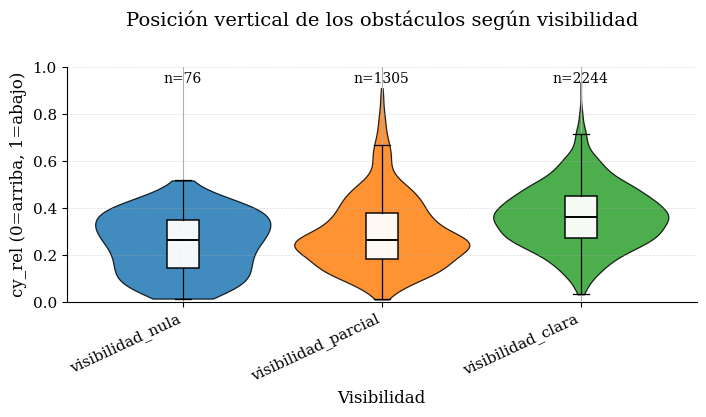

Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/boxplot_cy_rel_obstaculos_visibilidad_color.pdf


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Helper

def clean_unlabeled(s: pd.Series) -> pd.Series:
    """
    Elimina valores sin etiqueta:
    - NaN / <NA>
    - strings vacíos o solo espacios
    - 'nan', 'None', 'Sin etiqueta' (case-insensitive)
    """
    s = s.astype("string")
    s = s.replace(r"^\s*$", pd.NA, regex=True)
    s = s.where(~s.str.strip().str.lower().isin({"nan", "none", "sin etiqueta"}), pd.NA)
    return s.dropna()

# Violin
for c in ["visibilidad", "cy_rel"]:
    if c not in obst.columns:
        raise KeyError(f"Falta la columna '{c}' en obst.")

vis_clean = clean_unlabeled(obst["visibilidad"])
obst_plot = obst.loc[vis_clean.index].copy()
obst_plot["visibilidad"] = vis_clean

order_vis = ["alta", "media", "baja"]
present = [c for c in order_vis if c in obst_plot["visibilidad"].unique()]
if len(present) >= 2:
    vis_order = present
else:
    vis_order = (
        obst_plot.groupby("visibilidad")["cy_rel"]
        .median()
        .sort_values()
        .index.tolist()
    )

data = [obst_plot.loc[obst_plot["visibilidad"] == c, "cy_rel"].dropna().values for c in vis_order]
ns = [len(d) for d in data]

# Estilo
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 11
plt.rcParams["axes.linewidth"] = 0.8

fig, ax = plt.subplots(figsize=(7.2, 4.3))

cmap = plt.get_cmap("tab10")
colors = [cmap(i) for i in range(len(vis_order))]
positions = np.arange(1, len(vis_order) + 1)

# Violín
vp = ax.violinplot(
    data,
    positions=positions,
    widths=0.88,
    showmeans=False,
    showmedians=False,
    showextrema=False,
    points=200,
    bw_method="scott",
)
for i, body in enumerate(vp["bodies"]):
    body.set_facecolor(colors[i])
    body.set_edgecolor("black")
    body.set_linewidth(0.9)
    body.set_alpha(0.85)

# Boxplot
bp = ax.boxplot(
    data,
    positions=positions,
    widths=0.16,
    patch_artist=True,
    showfliers=False,
    manage_ticks=False,
    whis=1.5
)
for box in bp["boxes"]:
    box.set(facecolor="white", edgecolor="black", linewidth=1.1, alpha=0.95)
for m in bp["medians"]:
    m.set(color="black", linewidth=1.4)
for w in bp["whiskers"]:
    w.set(color="black", linewidth=0.9)
for c in bp["caps"]:
    c.set(color="black", linewidth=0.9)

# Títulos y etiquetas
ax.set_title("Posición vertical de los obstáculos según visibilidad", fontsize=14, pad=30)
ax.set_xlabel("Visibilidad", fontsize=12)
ax.set_ylabel("cy_rel (0=arriba, 1=abajo)", fontsize=12)
ax.set_ylim(0, 1)

ax.grid(True, axis="y", linestyle="--", linewidth=0.5, alpha=0.45)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

ymin, ymax = ax.get_ylim()
ax.set_ylim(ymin, 1.0)
y_text = 0.98

for i, n in enumerate(ns, start=1):
    ax.text(
        i,
        y_text,
        f"n={n}",
        ha="center",
        va="top",
        fontsize=10,
        color="black"
    )

ax.set_xticks(positions)
ax.set_xticklabels(vis_order, rotation=25, ha="right")

plt.tight_layout()
plt.show()

# Guardar figura
output_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/boxplot_cy_rel_obstaculos_visibilidad_color.pdf"
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Figura guardada en: {output_path}")

N obstáculos válidos: 1347
Severidad sin match tras merge (%): 0.8166295471417966


C:\Users\joano\AppData\Local\Temp\ipykernel_9068\1170167752.py:49: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data, labels=sev_order, patch_artist=True, showfliers=False)


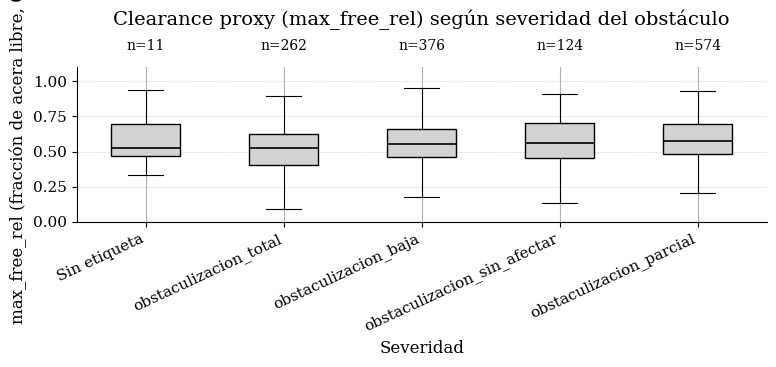

Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/boxplot_max_free_rel_obstaculos_severidad.pdf


C:\Users\joano\AppData\Local\Temp\ipykernel_9068\1170167752.py:93: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_s.groupby("bin")


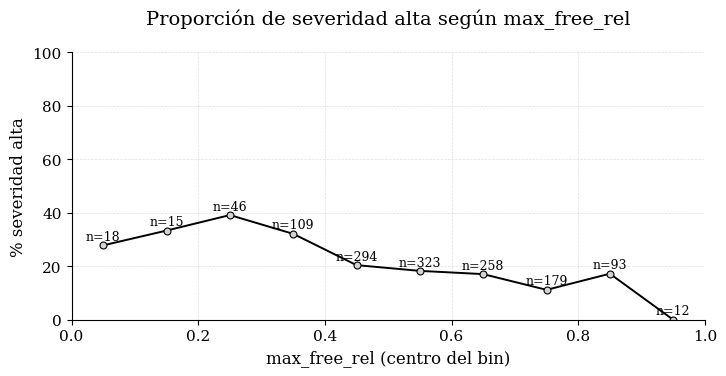

Figura guardada en: C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/curva_severidad_alta_vs_max_free_rel.pdf


,bin,n,pct_high,mean_max_free,bin_center
0,"(-0.001, 0.1]",18,27.777778,0.013704,0.0495
1,"(0.1, 0.2]",15,33.333333,0.150347,0.1500
2,"(0.2, 0.3]",46,39.130435,0.261195,0.2500
3,"(0.3, 0.4]",109,32.110092,0.357553,0.3500
4,"(0.4, 0.5]",294,20.408163,0.459560,0.4500
5,"(0.5, 0.6]",323,18.266254,0.548236,0.5500
6,"(0.6, 0.7]",258,17.054264,0.646708,0.6500
7,"(0.7, 0.8]",179,11.173184,0.746047,0.7500
8,"(0.8, 0.9]",93,17.204301,0.835640,0.8500
9,"(0.9, 1.0]",12,0.000000,0.920722,0.9500


In [ ]:
# Estilo
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 11
plt.rcParams["axes.linewidth"] = 0.8

# Dataset base
df_s = df_debug[(df_debug["valid_sidewalk"]) & (df_debug["class_name"] == "obstaculo")].copy()

# Reconstruir xmin/ymin/xmax/ymax a partir de full_box
tmp = np.vstack(df_s["full_box"].values) 
df_s["xmin"], df_s["ymin"], df_s["xmax"], df_s["ymax"] = tmp[:,0], tmp[:,1], tmp[:,2], tmp[:,3]

# Traer severidad desde df original
df_attr = df[df["class_name"] == "obstaculo"][["image_id","xmin","ymin","xmax","ymax","severidad"]].copy()

ROUND = 2
for c in ["xmin","ymin","xmax","ymax"]:
    df_s[c] = df_s[c].astype(float).round(ROUND)
    df_attr[c] = df_attr[c].astype(float).round(ROUND)

df_s = df_s.merge(df_attr, on=["image_id","xmin","ymin","xmax","ymax"], how="left")

# Limpieza severidad
df_s["severidad"] = df_s["severidad"].fillna("Sin etiqueta").astype(str)
df_s["severidad"] = df_s["severidad"].replace({"": "Sin etiqueta", "nan": "Sin etiqueta", "None": "Sin etiqueta"})

# Filtrar clearance válido
df_s = df_s[df_s["max_free_rel"].notna() & (df_s["max_free_rel"].between(0,1))].copy()

print("N obstáculos válidos:", len(df_s))
print("Severidad sin match tras merge (%):", 100*df_s["severidad"].eq("Sin etiqueta").mean())

# FIGURA A: max_free_rel por severidad
sev_order = (
    df_s.groupby("severidad")["max_free_rel"]
        .median()
        .sort_values()
        .index
        .tolist()
)

data = [df_s.loc[df_s["severidad"] == s, "max_free_rel"].values for s in sev_order]
ns = [len(d) for d in data]

fig_h = max(3.8, 0.35 * len(sev_order) + 2.0)
fig, ax = plt.subplots(figsize=(7.8, fig_h))

bp = ax.boxplot(data, labels=sev_order, patch_artist=True, showfliers=False)

for box in bp["boxes"]:
    box.set(facecolor="lightgray", edgecolor="black", linewidth=1.0)
for w in bp["whiskers"]:
    w.set(color="black", linewidth=0.8)
for c in bp["caps"]:
    c.set(color="black", linewidth=0.8)
for m in bp["medians"]:
    m.set(color="black", linewidth=1.2)

# Títulos y etiquetas
ax.set_title("Clearance proxy (max_free_rel) según severidad del obstáculo", fontsize=14, pad=30)
ax.set_xlabel("Severidad", fontsize=12)
ax.set_ylabel("max_free_rel (fracción de acera libre, 0–1)", fontsize=12)

ax.set_ylim(0, 1.10)
ax.grid(True, axis="y", linestyle="--", linewidth=0.5, alpha=0.5)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

for i, n in enumerate(ns, start=1):
    ax.text(i, 1.3, f"n={n}", ha="center", va="top", fontsize=10)

plt.xticks(rotation=25, ha="right")
plt.tight_layout()
plt.show()

# Guardar figura
output_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/boxplot_max_free_rel_obstaculos_severidad.pdf"
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Figura guardada en: {output_path}")

# FIGURA B: % severidad “alta” por bins de max_free_rel

HIGH_LABELS = {"obstaculizacion_total", "alta", "muy_alta", "severa", "severo"}

df_s["is_high_sev"] = df_s["severidad"].str.lower().isin(HIGH_LABELS).astype(int)

n_bins = 10
bins = np.linspace(0, 1, n_bins + 1)
df_s["bin"] = pd.cut(df_s["max_free_rel"], bins=bins, include_lowest=True)

curve = (
    df_s.groupby("bin")
        .agg(
            n=("is_high_sev", "size"),
            pct_high=("is_high_sev", lambda x: 100*x.mean()),
            mean_max_free=("max_free_rel", "mean")
        )
        .reset_index()
)

curve["bin_center"] = curve["bin"].apply(lambda it: (it.left + it.right) / 2)

fig, ax = plt.subplots(figsize=(7.4, 3.9))

ax.plot(
    curve["bin_center"],
    curve["pct_high"],
    color="black",
    linewidth=1.4,
    marker="o",
    markersize=5,
    markerfacecolor="lightgray",
    markeredgecolor="black",
    markeredgewidth=0.8
)

for x, y, n in zip(curve["bin_center"], curve["pct_high"], curve["n"]):
    y_text = min(y + 2.0, 98.0)
    ax.text(x, y_text, f"n={n}", ha="center", fontsize=9, color="black")

ax.set_title("Proporción de severidad alta según max_free_rel", fontsize=14, pad=20)
ax.set_xlabel("max_free_rel (centro del bin)", fontsize=12)
ax.set_ylabel("% severidad alta", fontsize=12)

ax.set_xlim(0, 1)
ax.set_ylim(0, 100)
ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.4)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.tight_layout()

plt.show()

# Guardar figura
output_path = "C:/Users/joano/Desktop/trabajo_final_master/latex_objects/eda/curva_severidad_alta_vs_max_free_rel.pdf"
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Figura guardada en: {output_path}")

curve

Saved: annotated_outputs\annotated_gsv-chicago-86-Obstacle_nolabels.png


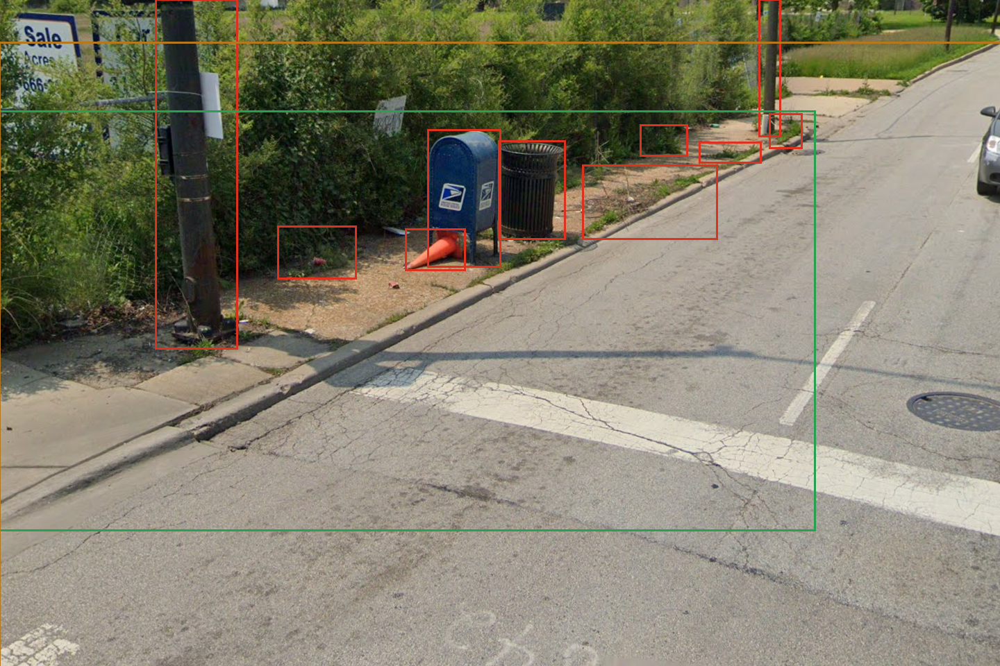

In [ ]:
from pathlib import Path
import pandas as pd
from PIL import Image, ImageDraw

CSV_PATH = r"C:\Users\joano\Desktop\trabajo_final_master\data\annotations\annotations.csv"
IMG_DIR  = r"C:\Users\joano\Desktop\trabajo_final_master\data\images\annotated_images"      
IMAGE_NAME = "gsv-chicago-86-Obstacle.png"

OUT_DIR = "annotated_outputs"
Path(OUT_DIR).mkdir(parents=True, exist_ok=True)

ann = pd.read_csv(CSV_PATH)

def find_image_path(img_dir: str, image_name: str) -> Path:
    p = Path(img_dir) / image_name
    if p.exists():
        return p
    matches = list(Path(img_dir).rglob(image_name))
    if matches:
        return matches[0]
    raise FileNotFoundError(f"Image '{image_name}' not found in '{img_dir}' (or its subfolders).")

def draw_and_save_no_labels(image_name: str, img_dir: str, out_dir: str) -> Path:
    df_img = ann[ann["image_id"] == image_name].copy()
    if df_img.empty:
        raise ValueError(f"No rows found in CSV for image_id='{image_name}'")

    img_path = find_image_path(img_dir, image_name)
    img = Image.open(img_path).convert("RGB")
    draw = ImageDraw.Draw(img)

    COLORS = {
        "obstaculo": (220, 50, 32),
        "no_obstaculo": (30, 130, 200),
        "acera": (40, 160, 80),
        "carretera": (180, 120, 30),
    }

    for _, r in df_img.iterrows():
        cls = str(r["class_name"])
        color = COLORS.get(cls, (255, 0, 255))

        x1 = int(round(float(r["xmin"])))
        y1 = int(round(float(r["ymin"])))
        x2 = int(round(float(r["xmax"])))
        y2 = int(round(float(r["ymax"])))

        for t in range(3):
            draw.rectangle([x1 - t, y1 - t, x2 + t, y2 + t], outline=color)

    out_path = Path(out_dir) / f"annotated_{Path(image_name).stem}_nolabels.png"
    img.save(out_path)
    return out_path

out_file = draw_and_save_no_labels(IMAGE_NAME, IMG_DIR, OUT_DIR)
print("Saved:", out_file)

try:
    from IPython.display import display
    display(Image.open(out_file))
except Exception:
    pass

Saved: annotated_outputs\pred_gsv-columbus-315-Obstacle.png


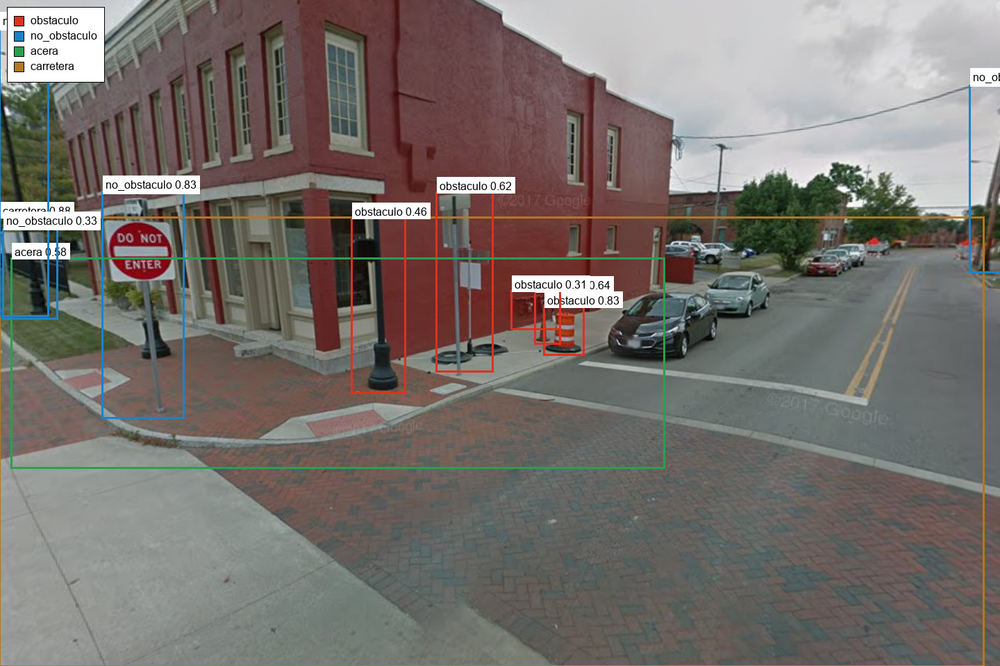

In [ ]:
from pathlib import Path
from PIL import Image, ImageDraw, ImageFont
from ultralytics import YOLO

MODEL_PATH = r"C:\Users\joano\Desktop\trabajo_final_master\runs\exp1\v5_full_seed999\weights\best.pt" 
IMG_DIR  = r"C:\Users\joano\Desktop\trabajo_final_master\data\images\annotated_images"
IMAGE_NAME = "gsv-columbus-315-Obstacle.png"

OUT_DIR = "annotated_outputs"
Path(OUT_DIR).mkdir(parents=True, exist_ok=True)

def find_image_path(img_dir: str, image_name: str) -> Path:
    p = Path(img_dir) / image_name
    if p.exists():
        return p
    matches = list(Path(img_dir).rglob(image_name))
    if matches:
        return matches[0]
    raise FileNotFoundError(f"Image '{image_name}' not found in '{img_dir}' (or its subfolders).")

def get_font(size=16):
    for fp in [
        "C:/Windows/Fonts/arial.ttf",
        "C:/Windows/Fonts/calibri.ttf",
        "/usr/share/fonts/truetype/dejavu/DejaVuSans.ttf",
    ]:
        try:
            return ImageFont.truetype(fp, size=size)
        except Exception:
            pass
    return ImageFont.load_default()

def color_for_class(cls_id: int):
    palette = [
        (220, 50, 32),   (30, 130, 200), (40, 160, 80),  (180, 120, 30),
        (155, 89, 182),  (241, 196, 15), (46, 204, 113), (231, 76, 60),
        (52, 73, 94),    (26, 188, 156), (127, 140, 141),(230, 126, 34)
    ]
    return palette[int(cls_id) % len(palette)]

def draw_predictions_with_legend(
    image_name: str,
    img_dir: str,
    out_dir: str,
    model_path: str,
    conf_thres: float = 0.25,
    iou_thres: float = 0.45,
    thickness: int = 3
) -> Path:
    img_path = find_image_path(img_dir, image_name)

    model = YOLO(model_path)

    res = model.predict(source=str(img_path), conf=conf_thres, iou=iou_thres, verbose=False)[0]

    img = Image.open(img_path).convert("RGB")
    draw = ImageDraw.Draw(img)
    font = get_font(16)

    if res.boxes is None or len(res.boxes) == 0:
        out_path = Path(out_dir) / f"pred_{Path(image_name).stem}_NO_DETECTIONS.png"
        img.save(out_path)
        return out_path

    xyxy = res.boxes.xyxy.cpu().numpy()
    cls_ids = res.boxes.cls.cpu().numpy().astype(int)
    confs = res.boxes.conf.cpu().numpy()

    names = model.names
    def cls_name(i):
        if isinstance(names, dict):
            return names.get(int(i), str(int(i)))
        return names[int(i)] if int(i) < len(names) else str(int(i))

    present_classes = sorted(set(int(c) for c in cls_ids))

    for (x1, y1, x2, y2), c, cf in zip(xyxy, cls_ids, confs):
        x1, y1, x2, y2 = map(lambda v: int(round(float(v))), (x1, y1, x2, y2))
        color = color_for_class(c)

        for t in range(thickness):
            draw.rectangle([x1 - t, y1 - t, x2 + t, y2 + t], outline=color)

        label = f"{cls_name(c)} {cf:.2f}"

        tw, th = draw.textbbox((0, 0), label, font=font)[2:]
        pad = 4
        lx1, ly1 = x1, max(0, y1 - th - 2 * pad)
        lx2, ly2 = x1 + tw + 2 * pad, ly1 + th + 2 * pad
        draw.rectangle([lx1, ly1, lx2, ly2], fill=(255, 255, 255))
        draw.text((lx1 + pad, ly1 + pad), label, fill=(0, 0, 0), font=font)

    legend_font = get_font(16)
    line_h = 22
    box_size = 14
    pad = 10

    legend_items = [cls_name(c) for c in present_classes]
    max_text_w = 0
    for txt in legend_items:
        w = draw.textbbox((0, 0), txt, font=legend_font)[2]
        max_text_w = max(max_text_w, w)

    legend_w = pad * 3 + box_size + max_text_w
    legend_h = pad * 2 + line_h * len(present_classes)

    x0, y0 = 10, 10
    draw.rectangle([x0, y0, x0 + legend_w, y0 + legend_h], fill=(255, 255, 255), outline=(0, 0, 0))

    for i, c in enumerate(present_classes):
        cy = y0 + pad + i * line_h
        cx = x0 + pad
        color = color_for_class(c)
        draw.rectangle([cx, cy + 3, cx + box_size, cy + 3 + box_size], fill=color, outline=(0, 0, 0))
        draw.text((cx + box_size + pad, cy), cls_name(c), fill=(0, 0, 0), font=legend_font)

    out_path = Path(out_dir) / f"pred_{Path(image_name).stem}.png"
    img.save(out_path)
    return out_path

out_file = draw_predictions_with_legend(
    IMAGE_NAME, IMG_DIR, OUT_DIR, MODEL_PATH,
    conf_thres=0.25, iou_thres=0.45, thickness=3
)
print("Saved:", out_file)

try:
    from IPython.display import display
    display(Image.open(out_file))
except Exception:
    pass
